Looking for auxiliary files...

Looking for file: /Users/deepakkumar/Downloads/1B.KNR24.mcs
Station: KNR24
Network Code: 1B
Recording start: 2017-09-11 12:34:00
Sample rate: 100 Hz
File size: 1615246848 bytes
File size: 1540.42 MB
Successfully read 1615242752 bytes from file
Total bytes read: 1615242752
Bytes per time step: 12
Remainder bytes: 8
Complete time steps: 134603562
Remaining bytes (will be truncated): 8
Using 1615242744 bytes (134603562 complete time steps)
Processed 134603562 samples per channel

Analyzing data for amplitude detection...
No amplitude detected starting at sample 5000 (time: 50.0 seconds)
Amplitude detected until sample: 5000
Amplitude detected until time: 50.0 seconds
Using 5000 samples with detected amplitude
Duration with amplitude: 50.00 seconds
Amplitude period: 2017-09-11 12:34:00 to 2017-09-11 12:34:50

Calculating amplitude over time for each channel...
Channel 0 (Hydrophone): Max pressure = 2174799.6963 Pa
Channel 1 (Seismometer Z): Max amplitude = 8

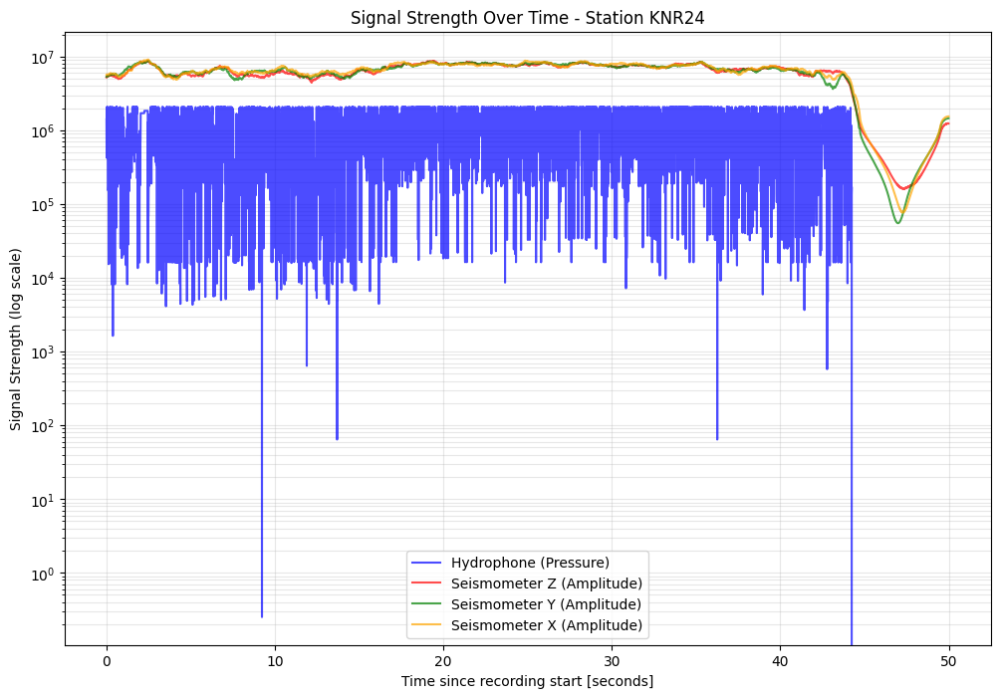


Creating spectrograms for each channel...
Creating spectrogram for Hydrophone...
Spectrogram saved to: /Users/deepakkumar/Downloads/mcs_KNR24_Hydrophone_spectrogram.png
Creating spectrogram for Seismometer Z...
Spectrogram saved to: /Users/deepakkumar/Downloads/mcs_KNR24_Seismometer_Z_spectrogram.png
Creating spectrogram for Seismometer Y...
Spectrogram saved to: /Users/deepakkumar/Downloads/mcs_KNR24_Seismometer_Y_spectrogram.png
Creating spectrogram for Seismometer X...
Spectrogram saved to: /Users/deepakkumar/Downloads/mcs_KNR24_Seismometer_X_spectrogram.png

Creating 10 segments of 5 seconds each (with amplitude)
Segment 1 plot saved to: /Users/deepakkumar/Downloads/mcs_KNR24_1B_segment1_0-5sec.png


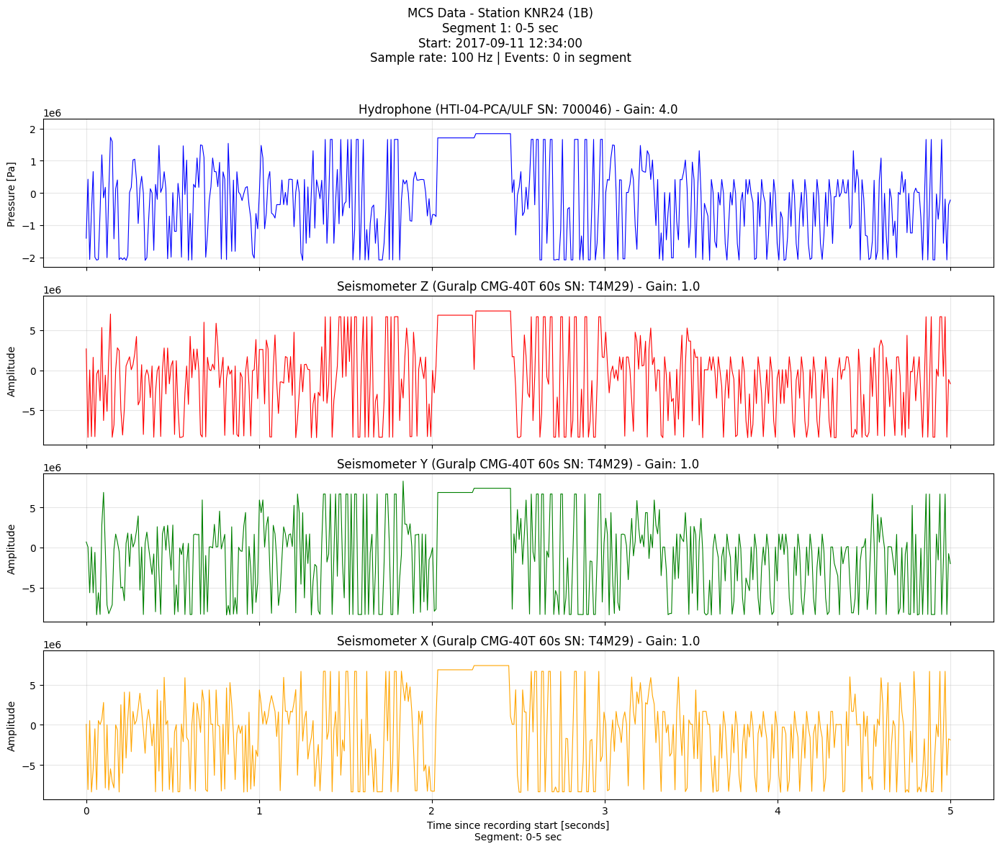

Segment 2 plot saved to: /Users/deepakkumar/Downloads/mcs_KNR24_1B_segment2_5-10sec.png


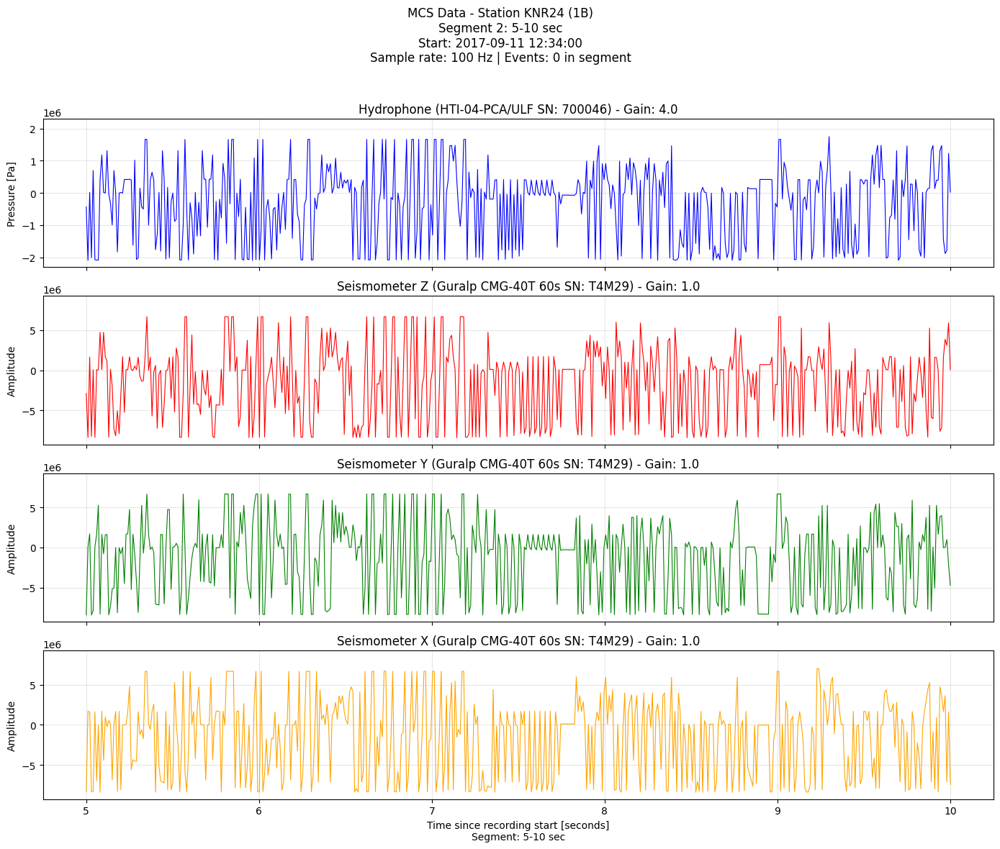

Segment 3 plot saved to: /Users/deepakkumar/Downloads/mcs_KNR24_1B_segment3_10-15sec.png


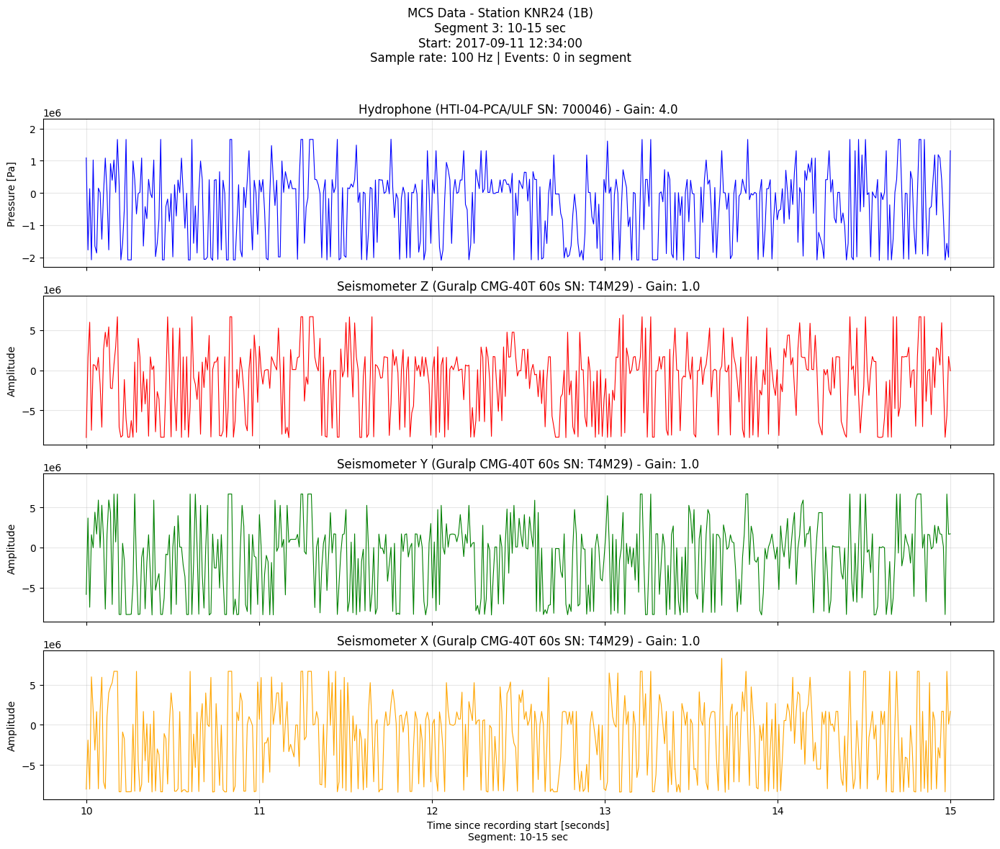

Segment 4 plot saved to: /Users/deepakkumar/Downloads/mcs_KNR24_1B_segment4_15-20sec.png


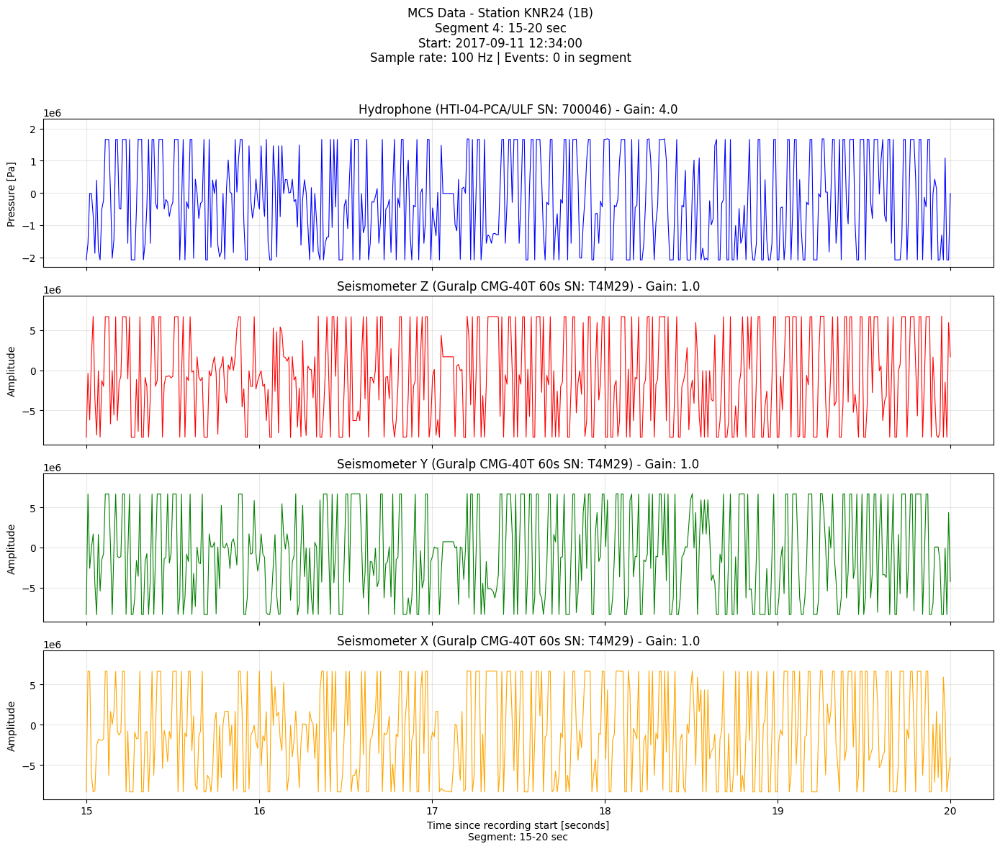

Segment 5 plot saved to: /Users/deepakkumar/Downloads/mcs_KNR24_1B_segment5_20-25sec.png


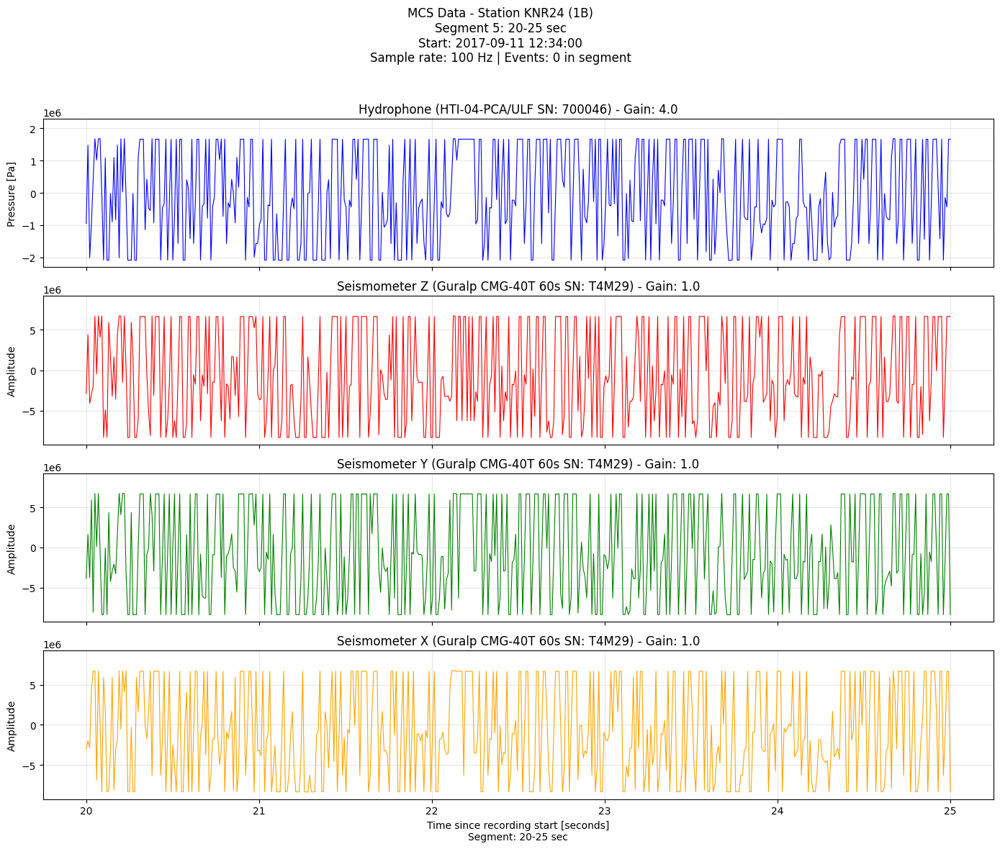

Segment 6 plot saved to: /Users/deepakkumar/Downloads/mcs_KNR24_1B_segment6_25-30sec.png


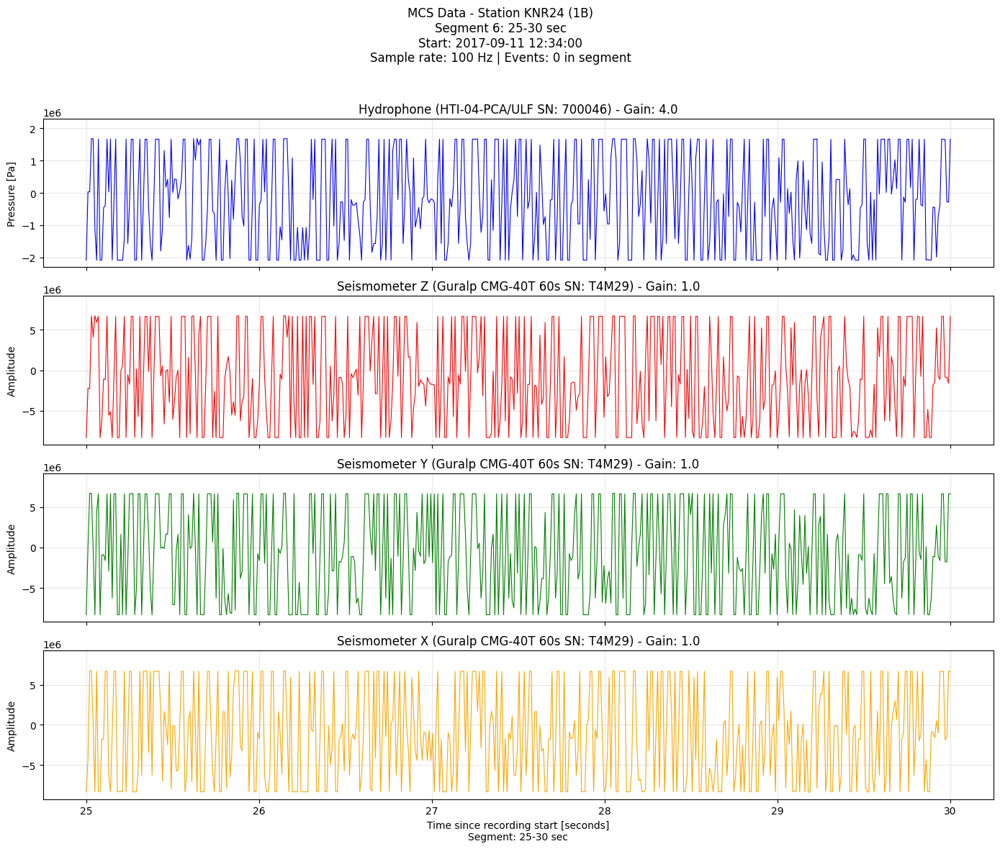

Segment 7 plot saved to: /Users/deepakkumar/Downloads/mcs_KNR24_1B_segment7_30-35sec.png


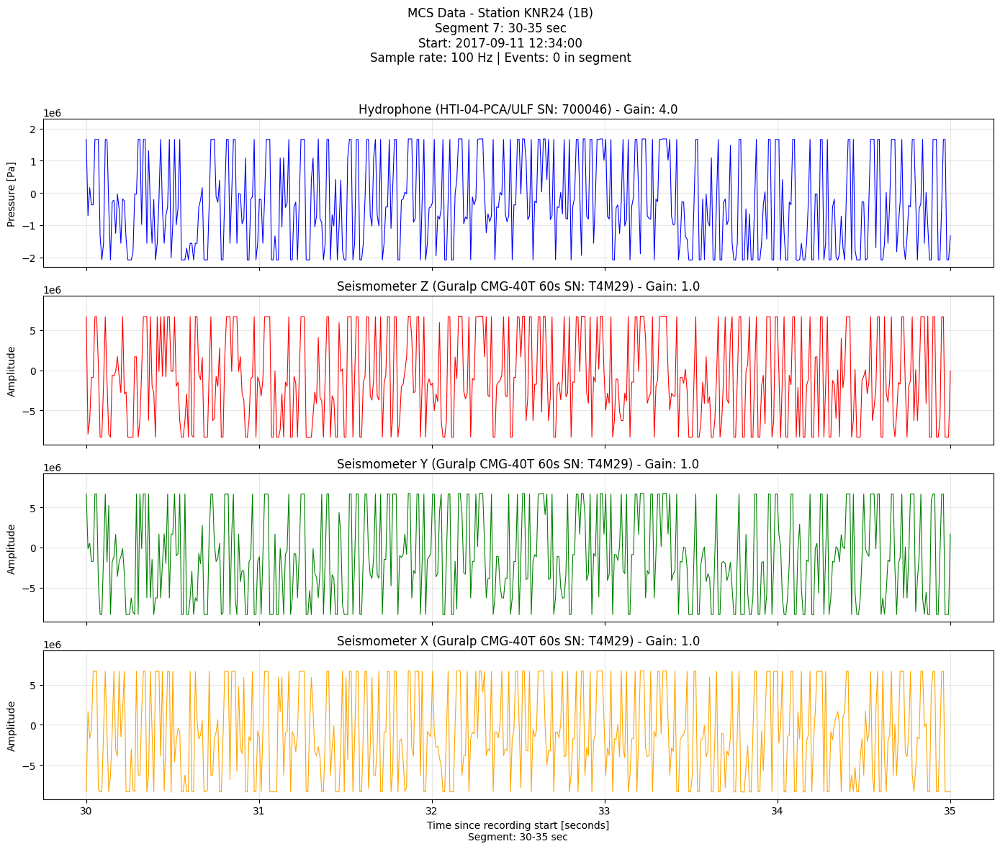

Segment 8 plot saved to: /Users/deepakkumar/Downloads/mcs_KNR24_1B_segment8_35-40sec.png


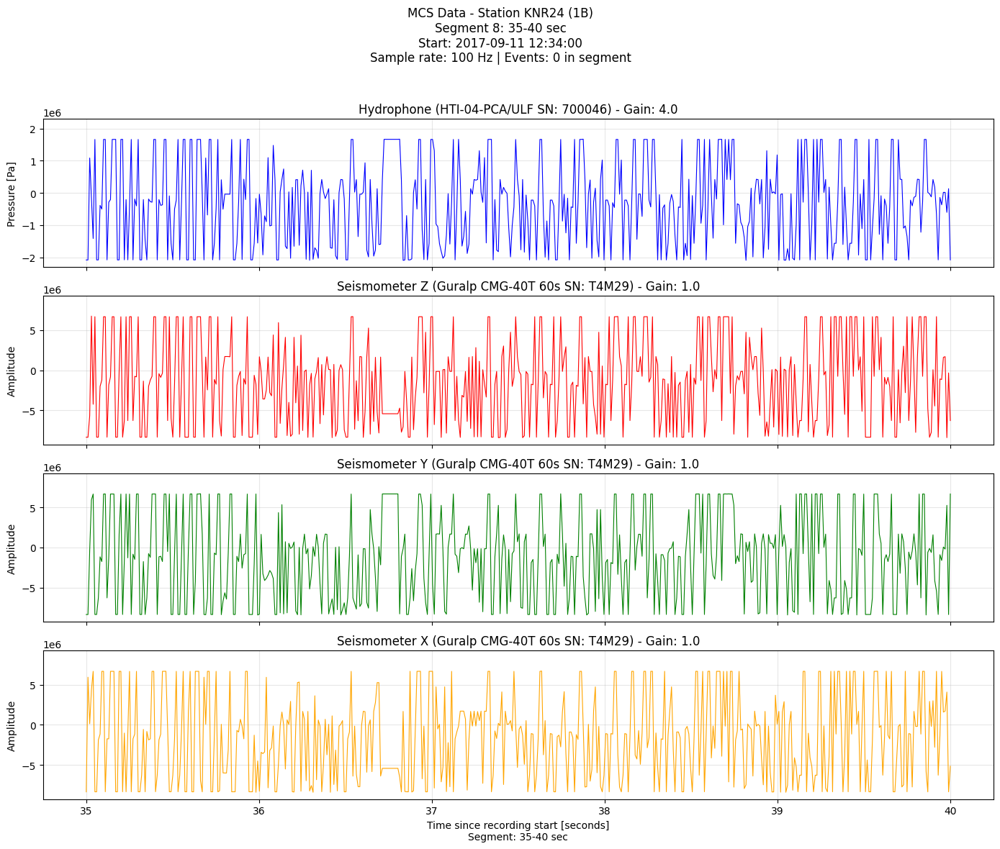

Segment 9 plot saved to: /Users/deepakkumar/Downloads/mcs_KNR24_1B_segment9_40-45sec.png


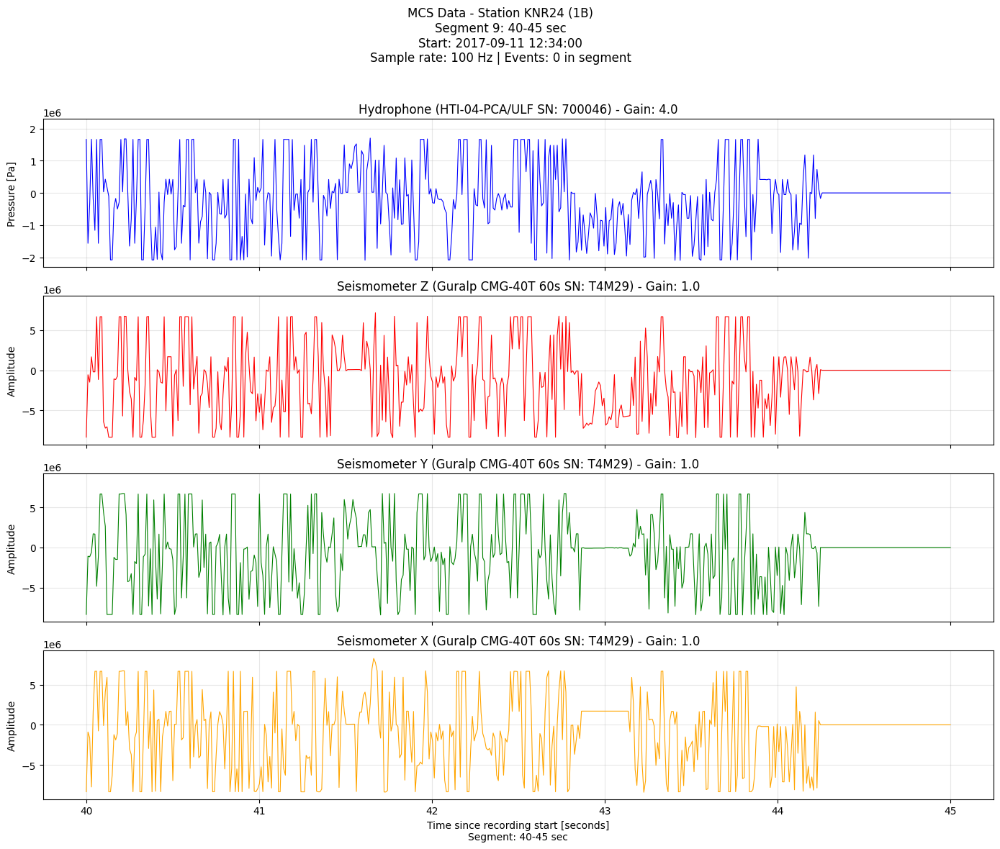

Skipping segment 10: No amplitude detected

Creating spectrograms for each channel...
Creating spectrogram for Hydrophone...
Individual spectrogram saved to: /Users/deepakkumar/Downloads/mcs_KNR24_Hydrophone_spectrogram.png
Creating spectrogram for Seismometer Z...
Individual spectrogram saved to: /Users/deepakkumar/Downloads/mcs_KNR24_Seismometer_Z_spectrogram.png
Creating spectrogram for Seismometer Y...
Individual spectrogram saved to: /Users/deepakkumar/Downloads/mcs_KNR24_Seismometer_Y_spectrogram.png
Creating spectrogram for Seismometer X...
Individual spectrogram saved to: /Users/deepakkumar/Downloads/mcs_KNR24_Seismometer_X_spectrogram.png


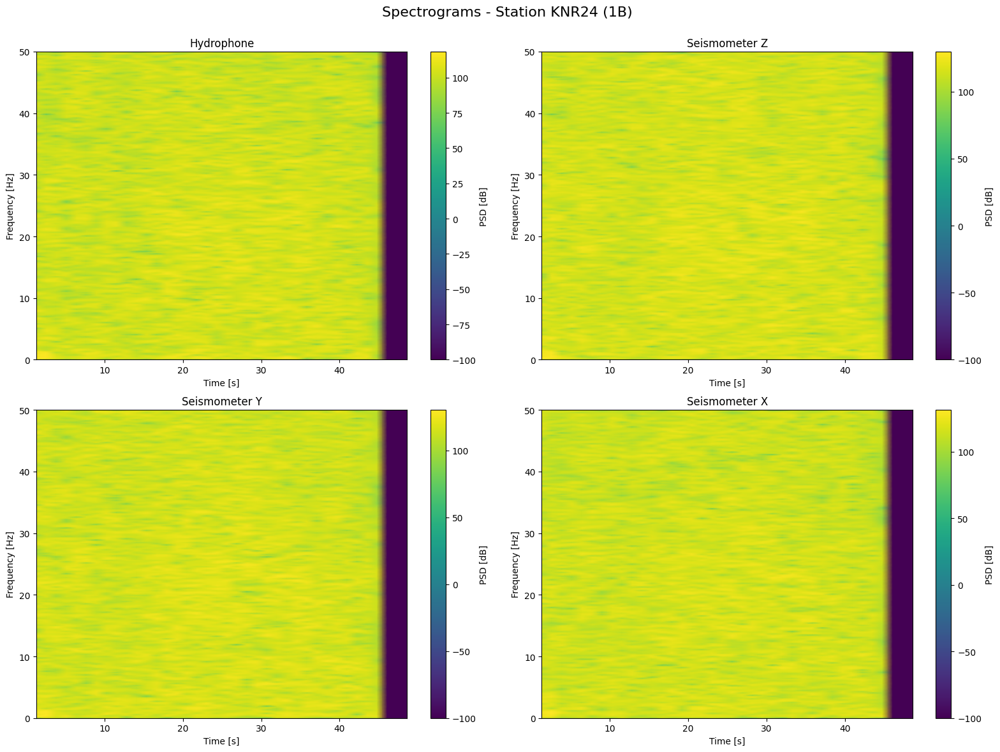


=== COMPREHENSIVE SUMMARY ===
Station: KNR24 (1B)
Location: 76.440°N, 6.751°E
Recording period: 2017-09-11 12:34:00 to 2017-09-11 12:34:50
Total duration with amplitude: 0.8 minutes
Sample rate: 100 Hz
Number of events detected: 0
GPS time updates: 0
Temperature readings: 0
Battery voltage readings: 0

=== SIGNAL STRENGTH ANALYSIS ===

Hydrophone Statistics:
  Maximum pa: 2097120.0000
  Minimum pa: 0.2500
  Average pa: 994659.6618
  Initial pa: 524443.5603
  Decay constant: -0.009625 s⁻¹
  Signal half-life: Infinite (no significant decay)

Seismometer Z Statistics:
  Maximum amplitude: 8883574.3262
  Minimum amplitude: 161756.5431
  Average amplitude: 6148416.1090
  Initial amplitude: 10796717.0915
  Decay constant: 0.031143 s⁻¹
  Signal half-life: 22.26 seconds

Seismometer Y Statistics:
  Maximum amplitude: 8822120.9805
  Minimum amplitude: 55042.1446
  Average amplitude: 6173816.0727
  Initial amplitude: 11757366.4347
  Decay constant: 0.035527 s⁻¹
  Signal half-life: 19.51 seconds

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import os
import re
from datetime import datetime, timedelta
from scipy import signal
from scipy.ndimage import uniform_filter1d

# Get the path to the Downloads folder
downloads_path = os.path.expanduser('~/Downloads')
file_path = os.path.join(downloads_path, '1B.KNR24.mcs')

# Metadata dictionary
metadata = {
    'Event': 'PS109_1-1, MSM68_11-1',
    'Project': 'KNIPAS',
    'PI': 'V. Schlindwein',
    'Code (FDSN Network Code)': '1B',
    'Station': 'KNR24',
    'Date/time start (Recording)': '2017-09-11T12:34',
    'Date/time start (Deployment)': '2017-09-14T09:29',
    'Latitude': '76.440',
    'Longitude': '6.751',
    'Elevation [m a.s.l.]': '-2688',
    'Date/time end (Recovery)': '2017-10-07T18:58',
    'Date/time end (Recording)': '2017-10-07T19:23',
    'Skew [µs]': '-2859719',
    'Recorder': 'MCS',
    'Recorder SN': '60720',
    'Seismometer': 'Guralp CMG-40T 60s',
    'Seismometer SN': 'T4M29',
    'Seismometer gain': '1',
    'Hydrophone': 'HTI-04-PCA/ULF',
    'Hydrophone SN': '700046',
    'Hydrophone gain': '4',
    'Hydrophone pol': 'Normal',
    'Sampling rate [Hz]': '100',
    'Expedition': 'PS109 / MSM68'
}

# Function to parse .log file
def parse_log_file(log_file_path):
    """Parse the .log file for recording information"""
    log_data = {
        'start_time': None,
        'end_time': None,
        'sample_rate': None,
        'file_size': None,
        'checksum': None,
        'errors': []
    }
    
    if not os.path.exists(log_file_path):
        print(f"Warning: Log file {log_file_path} not found")
        return log_data
    
    try:
        with open(log_file_path, 'r') as f:
            lines = f.readlines()
            
        for line in lines:
            line = line.strip()
            # Look for start time
            if 'Start time:' in line:
                try:
                    time_str = line.split('Start time:')[1].strip()
                    log_data['start_time'] = datetime.fromisoformat(time_str.replace(' ', 'T'))
                except:
                    log_data['errors'].append(f"Could not parse start time: {line}")
            
            # Look for end time
            elif 'End time:' in line:
                try:
                    time_str = line.split('End time:')[1].strip()
                    log_data['end_time'] = datetime.fromisoformat(time_str.replace(' ', 'T'))
                except:
                    log_data['errors'].append(f"Could not parse end time: {line}")
            
            # Look for sample rate
            elif 'Sample rate:' in line:
                try:
                    rate_str = line.split('Sample rate:')[1].strip().split(' ')[0]
                    log_data['sample_rate'] = float(rate_str)
                except:
                    log_data['errors'].append(f"Could not parse sample rate: {line}")
            
            # Look for file size
            elif 'File size:' in line:
                try:
                    size_str = line.split('File size:')[1].strip().split(' ')[0]
                    log_data['file_size'] = int(size_str)
                except:
                    log_data['errors'].append(f"Could not parse file size: {line}")
            
            # Look for checksum
            elif 'Checksum:' in line:
                try:
                    checksum_str = line.split('Checksum:')[1].strip()
                    log_data['checksum'] = checksum_str
                except:
                    log_data['errors'].append(f"Could not parse checksum: {line}")
    
    except Exception as e:
        print(f"Error reading log file: {e}")
    
    return log_data

# Function to parse .aux file
def parse_aux_file(aux_file_path):
    """Parse the .aux file for auxiliary information"""
    aux_data = {
        'gps_times': [],
        'temperature_readings': [],
        'battery_voltage': [],
        'clock_drift': [],
        'events': []
    }
    
    if not os.path.exists(aux_file_path):
        print(f"Warning: Aux file {aux_file_path} not found")
        return aux_data
    
    try:
        with open(aux_file_path, 'r') as f:
            lines = f.readlines()
            
        for line in lines:
            line = line.strip()
            # GPS time entries
            if line.startswith('GPS:'):
                try:
                    parts = line.split()
                    if len(parts) >= 3:
                        time_str = parts[1] + 'T' + parts[2]
                        aux_data['gps_times'].append(datetime.fromisoformat(time_str))
                except:
                    pass
            
            # Temperature readings
            elif line.startswith('TEMP:'):
                try:
                    temp_str = line.split('TEMP:')[1].strip().split(' ')[0]
                    aux_data['temperature_readings'].append(float(temp_str))
                except:
                    pass
            
            # Battery voltage
            elif line.startswith('BATT:'):
                try:
                    batt_str = line.split('BATT:')[1].strip().split(' ')[0]
                    aux_data['battery_voltage'].append(float(batt_str))
                except:
                    pass
            
            # Clock drift
            elif line.startswith('DRIFT:'):
                try:
                    drift_str = line.split('DRIFT:')[1].strip().split(' ')[0]
                    aux_data['clock_drift'].append(float(drift_str))
                except:
                    pass
            
            # Events (trigger times)
            elif line.startswith('EVENT:'):
                try:
                    parts = line.split()
                    if len(parts) >= 3:
                        time_str = parts[1] + 'T' + parts[2]
                        aux_data['events'].append(datetime.fromisoformat(time_str))
                except:
                    pass
    
    except Exception as e:
        print(f"Error reading aux file: {e}")
    
    return aux_data

# Function to create spectrogram
def create_spectrogram(data, sample_rate, channel_name, time_axis, output_path):
    """Create and save a spectrogram for the given data"""
    print(f"Creating spectrogram for {channel_name}...")
    
    # Parameters for spectrogram
    nperseg = 256  # Length of each segment
    noverlap = nperseg // 2  # Overlap between segments
    nfft = 512  # FFT length
    
    # Compute spectrogram
    f, t, Sxx = signal.spectrogram(data, fs=sample_rate, nperseg=nperseg, 
                                  noverlap=noverlap, nfft=nfft, scaling='density')
    
    # Convert to dB scale
    Sxx_db = 10 * np.log10(Sxx + 1e-10)  # Add small value to avoid log(0)
    
    # Create plot
    fig, ax = plt.subplots(figsize=(12, 8))
    im = ax.pcolormesh(t, f, Sxx_db, shading='gouraud', cmap='viridis')
    ax.set_ylabel('Frequency [Hz]')
    ax.set_xlabel('Time [s]')
    ax.set_title(f'Spectrogram - {channel_name}\nStation {metadata["Station"]}')
    
    # Add colorbar
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label('Power Spectral Density [dB]')
    
    # Set frequency limits (0-50 Hz for seismic data)
    ax.set_ylim(0, min(50, sample_rate/2))
    
    plt.tight_layout()
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    plt.close(fig)
    
    print(f"Spectrogram saved to: {output_path}")
    
    return f, t, Sxx_db

# Find and parse auxiliary files
print("Looking for auxiliary files...")
log_file_path = os.path.join(downloads_path, '1B.KNR24.log')
aux_file_path = os.path.join(downloads_path, '1B.KNR24.aux')

# Parse log file
log_data = parse_log_file(log_file_path)
if log_data['start_time']:
    print(f"Log file start time: {log_data['start_time']}")
if log_data['end_time']:
    print(f"Log file end time: {log_data['end_time']}")
if log_data['sample_rate']:
    print(f"Log file sample rate: {log_data['sample_rate']} Hz")

# Parse aux file
aux_data = parse_aux_file(aux_file_path)
if aux_data['gps_times']:
    print(f"Aux file GPS times: {len(aux_data['gps_times'])} entries")
if aux_data['events']:
    print(f"Aux file events: {len(aux_data['events'])} detected events")

# Use metadata values for accuracy, prefer log file data if available
num_channels = 4
sample_rate = int(log_data['sample_rate'] or metadata['Sampling rate [Hz]'])
gain_factors = np.array([float(metadata['Hydrophone gain']), 
                         float(metadata['Seismometer gain']), 
                         float(metadata['Seismometer gain']), 
                         float(metadata['Seismometer gain'])])
bits_per_sample = 24
header_size_bytes = 4096

# Use log file start time if available, otherwise use metadata
recording_start = log_data['start_time'] or datetime.fromisoformat(metadata['Date/time start (Recording)'])

bytes_per_sample = bits_per_sample // 8
bytes_per_time_step = bytes_per_sample * num_channels

print(f"\nLooking for file: {file_path}")
print(f"Station: {metadata['Station']}")
print(f"Network Code: {metadata['Code (FDSN Network Code)']}")
print(f"Recording start: {recording_start}")
print(f"Sample rate: {sample_rate} Hz")

try:
    # First, get the total file size to determine available data duration
    file_size = os.path.getsize(file_path)
    print(f"File size: {file_size} bytes")
    print(f"File size: {file_size/1024/1024:.2f} MB")
    
    # Calculate total data bytes (excluding header)
    total_data_bytes = file_size - header_size_bytes
    if total_data_bytes <= 0:
        print("Error: File is too small or header size is larger than file size")
        exit()
    
    # Read the entire data section (after header)
    with open(file_path, 'rb') as f:
        f.seek(header_size_bytes)  # Skip header
        raw_data = np.fromfile(f, dtype=np.uint8, count=total_data_bytes)
        print(f"Successfully read {len(raw_data)} bytes from file")
        
except FileNotFoundError:
    print(f"Error: File '{file_path}' not found.")
    exit()
except Exception as e:
    print(f"Error reading file: {e}")
    exit()

# Handle the case where total bytes isn't divisible by bytes_per_time_step
total_bytes_read = len(raw_data)
print(f"Total bytes read: {total_bytes_read}")
print(f"Bytes per time step: {bytes_per_time_step}")
print(f"Remainder bytes: {total_bytes_read % bytes_per_time_step}")

# Calculate how many complete time steps we have
complete_time_steps = total_bytes_read // bytes_per_time_step
remaining_bytes = total_bytes_read % bytes_per_time_step

print(f"Complete time steps: {complete_time_steps}")
print(f"Remaining bytes (will be truncated): {remaining_bytes}")

# Truncate to complete time steps
usable_bytes = complete_time_steps * bytes_per_time_step
raw_data = raw_data[:usable_bytes]

print(f"Using {usable_bytes} bytes ({complete_time_steps} complete time steps)")

# Convert to 32-bit integers first to prevent overflow
raw_data_32bit = raw_data.astype(np.int32)
raw_data_reshaped = raw_data_32bit.reshape(-1, bytes_per_time_step)

# Process all channels at once using vectorized operations
data = np.zeros((raw_data_reshaped.shape[0], num_channels), dtype=np.float64)

for channel in range(num_channels):
    start_idx = channel * bytes_per_sample
    # Extract bytes for this channel
    byte1 = raw_data_reshaped[:, start_idx]      # Most significant byte
    byte2 = raw_data_reshaped[:, start_idx + 1]  # Middle byte
    byte3 = raw_data_reshaped[:, start_idx + 2]  # Least significant byte
    
    # Convert 8-bit to 32-bit and combine into 24-bit values
    samples = (byte1.astype(np.int32) << 16) | (byte2.astype(np.int32) << 8) | byte3.astype(np.int32)
    
    # Handle two's complement for 24-bit signed integers
    samples = np.where(samples > 0x7FFFFF, samples - 0x1000000, samples)
    
    # Apply gain factor
    data[:, channel] = samples.astype(np.float64) / gain_factors[channel]

print(f"Processed {data.shape[0]} samples per channel")

# Function to detect if amplitude is present
def has_amplitude(signal_data, noise_threshold=0.01, flat_threshold=1e-6):
    """Check if the signal has detectable amplitude."""
    if len(signal_data) == 0:
        return False
    
    std_dev = np.std(signal_data)
    data_range = np.ptp(signal_data)
    max_abs = np.max(np.abs(signal_data))
    
    has_variation = (std_dev > noise_threshold) and (data_range > flat_threshold)
    has_amplitude = max_abs > (noise_threshold * 2)
    
    return has_variation and has_amplitude

# Function to find where amplitude stops being detected
def find_amplitude_end(data, sample_rate, chunk_size_seconds=10, noise_threshold=0.01):
    """Find the time when amplitude is no longer detected in the data."""
    chunk_size_samples = chunk_size_seconds * sample_rate
    total_samples = data.shape[0]
    
    for start_sample in range(0, total_samples, chunk_size_samples):
        end_sample = min(start_sample + chunk_size_samples, total_samples)
        chunk = data[start_sample:end_sample, :]
        
        any_amplitude = False
        for channel in range(data.shape[1]):
            if has_amplitude(chunk[:, channel], noise_threshold):
                any_amplitude = True
                break
        
        if not any_amplitude:
            print(f"No amplitude detected starting at sample {start_sample} "
                  f"(time: {start_sample/sample_rate:.1f} seconds)")
            return start_sample
    
    return total_samples

# Find where amplitude stops
print("\nAnalyzing data for amplitude detection...")
amplitude_end_sample = find_amplitude_end(data, sample_rate)
amplitude_end_seconds = amplitude_end_sample / sample_rate

print(f"Amplitude detected until sample: {amplitude_end_sample}")
print(f"Amplitude detected until time: {amplitude_end_seconds:.1f} seconds")

# Only process data where amplitude is detected
if amplitude_end_sample > 0:
    data_with_amplitude = data[:amplitude_end_sample, :]
    print(f"Using {amplitude_end_sample} samples with detected amplitude")
else:
    print("No amplitude detected in any channel!")
    data_with_amplitude = data[:min(1000, data.shape[0]), :]

# Calculate total duration of data with amplitude
total_duration_sec = data_with_amplitude.shape[0] / sample_rate
recording_end_amplitude = recording_start + timedelta(seconds=total_duration_sec)

print(f"Duration with amplitude: {total_duration_sec:.2f} seconds")
print(f"Amplitude period: {recording_start} to {recording_end_amplitude}")

# Channel information based on metadata - UPDATED
channel_names = ['Hydrophone', 'Seismometer Z', 'Seismometer Y', 'Seismometer X']
# KEEP pressure for hydrophone, use amplitude for seismometers
channel_units = ['Pressure [Pa]', 'Amplitude', 'Amplitude', 'Amplitude']
sensor_types = [metadata['Hydrophone'], metadata['Seismometer'], metadata['Seismometer'], metadata['Seismometer']]
sensor_sns = [metadata['Hydrophone SN'], metadata['Seismometer SN'], metadata['Seismometer SN'], metadata['Seismometer SN']]

# NEW: Calculate amplitude over time for each channel
print("\nCalculating amplitude over time for each channel...")

# Function to calculate amplitude envelope
def calculate_amplitude_envelope(signal_data, sample_rate, window_size=1.0):
    """Calculate the amplitude envelope of a signal using Hilbert transform."""
    # Apply Hilbert transform to get analytic signal
    analytic_signal = signal.hilbert(signal_data)
    amplitude_envelope = np.abs(analytic_signal)
    
    # Smooth the amplitude envelope
    window_samples = int(window_size * sample_rate)
    if window_samples > 0:
        amplitude_envelope = uniform_filter1d(amplitude_envelope, size=window_samples)
    
    return amplitude_envelope

# Calculate amplitude for each channel
amplitude_data = np.zeros_like(data_with_amplitude)
time_axis = np.arange(data_with_amplitude.shape[0]) / sample_rate

for i in range(num_channels):
    amplitude_data[:, i] = calculate_amplitude_envelope(data_with_amplitude[:, i], sample_rate)
    if i == 0:  # Hydrophone
        print(f"Channel {i} ({channel_names[i]}): Max pressure = {np.max(amplitude_data[:, i]):.4f} Pa")
    else:  # Seismometers
        print(f"Channel {i} ({channel_names[i]}): Max amplitude = {np.max(amplitude_data[:, i]):.4f}")

# NEW: Plot amplitude decay over time
plt.figure(figsize=(12, 8))
colors = ['blue', 'red', 'green', 'orange']

for i in range(num_channels):
    if i == 0:  # Hydrophone - keep as pressure
        plt.semilogy(time_axis, np.abs(data_with_amplitude[:, i]), color=colors[i], alpha=0.7, label=f"{channel_names[i]} (Pressure)")
    else:  # Seismometers - use amplitude
        plt.semilogy(time_axis, amplitude_data[:, i], color=colors[i], alpha=0.7, label=f"{channel_names[i]} (Amplitude)")

plt.xlabel('Time since recording start [seconds]')
plt.ylabel('Signal Strength (log scale)')
plt.title(f'Signal Strength Over Time - Station {metadata["Station"]}')
plt.legend()
plt.grid(True, which="both", ls="-", alpha=0.3)

# Save amplitude plot
amplitude_plot_path = os.path.join(downloads_path, f"mcs_{metadata['Station']}_signal_strength.png")
plt.savefig(amplitude_plot_path, dpi=300, bbox_inches='tight')
print(f"Signal strength plot saved to: {amplitude_plot_path}")
plt.show()

# NEW: Create spectrograms for each channel
print("\nCreating spectrograms for each channel...")
spectrogram_data = {}

for i in range(num_channels):
    if has_amplitude(data_with_amplitude[:, i]):
        # Create output path for spectrogram
        spectrogram_path = os.path.join(downloads_path, f"mcs_{metadata['Station']}_{channel_names[i].replace(' ', '_')}_spectrogram.png")
        
        # Create spectrogram
        f, t, Sxx_db = create_spectrogram(
            data_with_amplitude[:, i], 
            sample_rate, 
            channel_names[i], 
            time_axis,
            spectrogram_path
        )
        
        # Store spectrogram data for later analysis if needed
        spectrogram_data[i] = {
            'frequencies': f,
            'times': t,
            'spectrogram': Sxx_db
        }
    else:
        print(f"Skipping spectrogram for {channel_names[i]} - no amplitude detected")

# NEW: Calculate amplitude statistics
amplitude_stats = {}
for i in range(num_channels):
    if i == 0:  # Hydrophone - use pressure values
        channel_data = np.abs(data_with_amplitude[:, i])
        unit = "Pa"
    else:  # Seismometers - use amplitude envelope
        channel_data = amplitude_data[:, i]
        unit = "Amplitude"
    
    non_zero_data = channel_data[channel_data > 0]  # Avoid log(0) issues
    
    if len(non_zero_data) > 0:
        # Fit exponential decay to amplitude
        try:
            # Use linear regression on log-transformed data
            log_data = np.log(non_zero_data)
            time_non_zero = time_axis[:len(non_zero_data)]
            
            # Fit linear model to log(data) vs time
            coeffs = np.polyfit(time_non_zero, log_data, 1)
            decay_constant = -coeffs[0]  # Data ~ exp(-decay_constant * time)
            half_life = np.log(2) / decay_constant if decay_constant > 0 else float('inf')
            
            amplitude_stats[i] = {
                'initial_value': np.exp(coeffs[1]),
                'decay_constant': decay_constant,
                'half_life': half_life,
                'max_value': np.max(channel_data),
                'min_value': np.min(non_zero_data),
                'avg_value': np.mean(channel_data),
                'unit': unit
            }
        except:
            amplitude_stats[i] = {'error': 'Could not calculate decay parameters', 'unit': unit}

# Create segmented plots only for data with amplitude
segment_duration = 5  # seconds per segment
samples_per_segment = segment_duration * sample_rate

# Calculate how many complete segments we can plot within amplitude range
num_complete_segments = min(20, data_with_amplitude.shape[0] // samples_per_segment)
print(f"\nCreating {num_complete_segments} segments of {segment_duration} seconds each (with amplitude)")

# Mark events from aux file on the plots
event_times = []
if aux_data['events']:
    for event_time in aux_data['events']:
        event_seconds = (event_time - recording_start).total_seconds()
        if 0 <= event_seconds <= total_duration_sec:
            event_times.append(event_seconds)
    print(f"Found {len(event_times)} events within recording period")

# Create plots for each segment with amplitude
for segment in range(num_complete_segments):
    start_sample = segment * samples_per_segment
    end_sample = start_sample + samples_per_segment
    
    # Check if this segment has amplitude
    segment_has_amplitude = False
    for channel in range(num_channels):
        if has_amplitude(data_with_amplitude[start_sample:end_sample, channel]):
            segment_has_amplitude = True
            break
    
    if not segment_has_amplitude:
        print(f"Skipping segment {segment + 1}: No amplitude detected")
        continue
    
    segment_data = data_with_amplitude[start_sample:end_sample, :]
    segment_time_relative = np.linspace(segment * segment_duration, (segment + 1) * segment_duration, samples_per_segment)
    
    # Create the plot for this segment
    fig, axes = plt.subplots(4, 1, figsize=(14, 12), sharex=True)
    
    colors = ['blue', 'red', 'green', 'orange']
    
    for i in range(num_channels):
        ax = axes[i]
        channel_data = segment_data[:, i]
        
        if has_amplitude(channel_data):
            ax.plot(segment_time_relative, channel_data, color=colors[i], linewidth=0.8)
            
            # Mark events in this segment
            for event_time in event_times:
                if segment * segment_duration <= event_time <= (segment + 1) * segment_duration:
                    ax.axvline(x=event_time, color='red', linestyle='--', alpha=0.7, linewidth=1)
                    ax.text(event_time, np.max(channel_data), 'EVENT', rotation=90, 
                           verticalalignment='top', fontsize=8, color='red')
            
            ax.set_ylabel(channel_units[i])  # Use appropriate units for each channel
            ax.set_title(f'{channel_names[i]} ({sensor_types[i]} SN: {sensor_sns[i]}) - Gain: {gain_factors[i]}')
            ax.grid(True, alpha=0.3)
            
            data_range = np.max(np.abs(channel_data)) * 1.1
            if data_range > 0:
                ax.set_ylim(-data_range, data_range)
        else:
            ax.text(0.5, 0.5, 'No amplitude detected', transform=ax.transAxes, 
                   ha='center', va='center', fontsize=12, color='gray')
            ax.set_title(f'{channel_names[i]} - No amplitude in this segment')
            ax.set_ylabel(channel_units[i])  # Use appropriate units for each channel
    
    axes[-1].set_xlabel(f'Time since recording start [seconds]\nSegment: {segment * segment_duration}-{(segment + 1) * segment_duration} sec')
    
    # Create comprehensive title with metadata and aux file info
    title_text = (f"MCS Data - Station {metadata['Station']} ({metadata['Code (FDSN Network Code)']})\n"
                 f"Segment {segment + 1}: {segment * segment_duration}-{(segment + 1) * segment_duration} sec\n"
                 f"Start: {recording_start.strftime('%Y-%m-%d %H:%M:%S')}\n"
                 f"Sample rate: {sample_rate} Hz | Events: {len([e for e in event_times if segment * segment_duration <= e <= (segment + 1) * segment_duration])} in segment")
    
    plt.suptitle(title_text, fontsize=12)
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    
    # Save the plot
    output_filename = (f"mcs_{metadata['Station']}_{metadata['Code (FDSN Network Code)']}_"
                      f"segment{segment + 1}_{segment * segment_duration}-{(segment + 1) * segment_duration}sec.png")
    output_path = os.path.join(downloads_path, output_filename)
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"Segment {segment + 1} plot saved to: {output_path}")
    
    plt.show()

# NEW: Create and display spectrograms for each channel
print("\nCreating spectrograms for each channel...")
spectrogram_data = {}

# Create a figure for all spectrograms
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle(f'Spectrograms - Station {metadata["Station"]} ({metadata["Code (FDSN Network Code)"]})', fontsize=16)

for i in range(num_channels):
    if has_amplitude(data_with_amplitude[:, i]):
        print(f"Creating spectrogram for {channel_names[i]}...")
        
        # Parameters for spectrogram
        nperseg = 256  # Length of each segment
        noverlap = nperseg // 2  # Overlap between segments
        nfft = 512  # FFT length
        
        # Compute spectrogram
        f, t, Sxx = signal.spectrogram(data_with_amplitude[:, i], fs=sample_rate, nperseg=nperseg, 
                                      noverlap=noverlap, nfft=nfft, scaling='density')
        
        # Convert to dB scale
        Sxx_db = 10 * np.log10(Sxx + 1e-10)  # Add small value to avoid log(0)
        
        # Determine subplot position
        row, col = i // 2, i % 2
        ax = axes[row, col]
        
        # Create spectrogram plot
        im = ax.pcolormesh(t, f, Sxx_db, shading='gouraud', cmap='viridis')
        ax.set_ylabel('Frequency [Hz]')
        ax.set_xlabel('Time [s]')
        ax.set_title(f'{channel_names[i]}')
        
        # Set frequency limits (0-50 Hz for seismic data)
        ax.set_ylim(0, min(50, sample_rate/2))
        
        # Add colorbar to each subplot
        cbar = fig.colorbar(im, ax=ax)
        cbar.set_label('PSD [dB]')
        
        # Store spectrogram data for later analysis if needed
        spectrogram_data[i] = {
            'frequencies': f,
            'times': t,
            'spectrogram': Sxx_db
        }
        
        # Also save individual spectrogram plots
        spectrogram_path = os.path.join(downloads_path, f"mcs_{metadata['Station']}_{channel_names[i].replace(' ', '_')}_spectrogram.png")
        fig_ind, ax_ind = plt.subplots(figsize=(10, 6))
        im_ind = ax_ind.pcolormesh(t, f, Sxx_db, shading='gouraud', cmap='viridis')
        ax_ind.set_ylabel('Frequency [Hz]')
        ax_ind.set_xlabel('Time [s]')
        ax_ind.set_title(f'Spectrogram - {channel_names[i]}\nStation {metadata["Station"]}')
        ax_ind.set_ylim(0, min(50, sample_rate/2))
        cbar_ind = fig_ind.colorbar(im_ind, ax=ax_ind)
        cbar_ind.set_label('Power Spectral Density [dB]')
        plt.tight_layout()
        plt.savefig(spectrogram_path, dpi=300, bbox_inches='tight')
        plt.close(fig_ind)
        print(f"Individual spectrogram saved to: {spectrogram_path}")
        
    else:
        print(f"Skipping spectrogram for {channel_names[i]} - no amplitude detected")
        # Create empty plot for consistency
        row, col = i // 2, i % 2
        ax = axes[row, col]
        ax.text(0.5, 0.5, 'No amplitude detected', transform=ax.transAxes, 
               ha='center', va='center', fontsize=12, color='gray')
        ax.set_title(f'{channel_names[i]}')
        ax.set_xlabel('Time [s]')
        ax.set_ylabel('Frequency [Hz]')

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

# Create comprehensive summary with aux file information and amplitude analysis
print("\n=== COMPREHENSIVE SUMMARY ===")
print(f"Station: {metadata['Station']} ({metadata['Code (FDSN Network Code)']})")
print(f"Location: {metadata['Latitude']}°N, {metadata['Longitude']}°E")
print(f"Recording period: {recording_start} to {recording_end_amplitude}")
print(f"Total duration with amplitude: {total_duration_sec/60:.1f} minutes")
print(f"Sample rate: {sample_rate} Hz")
print(f"Number of events detected: {len(event_times)}")
print(f"GPS time updates: {len(aux_data['gps_times'])}")
print(f"Temperature readings: {len(aux_data['temperature_readings'])}")
print(f"Battery voltage readings: {len(aux_data['battery_voltage'])}")

if aux_data['battery_voltage']:
    print(f"Battery range: {min(aux_data['battery_voltage']):.2f}V - {max(aux_data['battery_voltage']):.2f}V")

# NEW: Print amplitude statistics
print("\n=== SIGNAL STRENGTH ANALYSIS ===")
for i in range(num_channels):
    if i in amplitude_stats and 'error' not in amplitude_stats[i]:
        stats = amplitude_stats[i]
        print(f"\n{channel_names[i]} Statistics:")
        print(f"  Maximum {stats['unit'].lower()}: {stats['max_value']:.4f}")
        print(f"  Minimum {stats['unit'].lower()}: {stats['min_value']:.4f}")
        print(f"  Average {stats['unit'].lower()}: {stats['avg_value']:.4f}")
        print(f"  Initial {stats['unit'].lower()}: {stats['initial_value']:.4f}")
        print(f"  Decay constant: {stats['decay_constant']:.6f} s⁻¹")
        if stats['half_life'] != float('inf'):
            print(f"  Signal half-life: {stats['half_life']:.2f} seconds")
        else:
            print(f"  Signal half-life: Infinite (no significant decay)")
    elif i in amplitude_stats:
        print(f"\n{channel_names[i]}: {amplitude_stats[i]['error']}")
    else:
        print(f"\n{channel_names[i]}: Could not calculate statistics")

print("\nProcessing complete with spectrogram analysis!")


ADVANCED DATA PROCESSING AND ANALYSIS

1. Applying bandpass filters (1-20 Hz)...
   Channel 0 (Hydrophone): Filter applied
   Channel 1 (Seismometer Z): Filter applied
   Channel 2 (Seismometer Y): Filter applied
   Channel 3 (Seismometer X): Filter applied

2. Calculating Power Spectral Density...


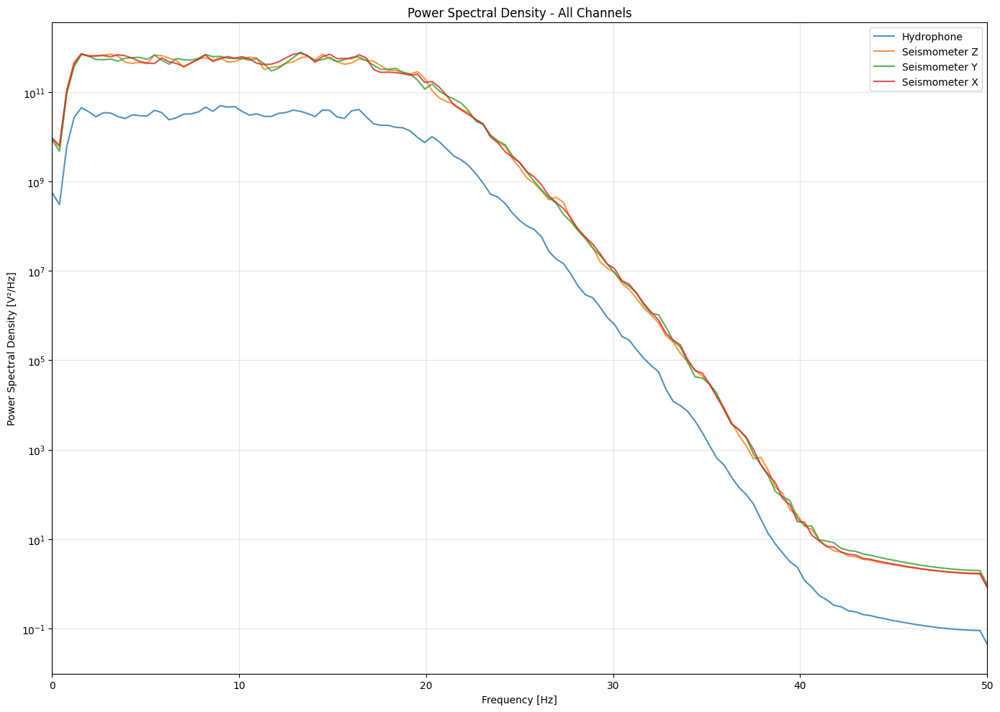


3. Cross-correlation analysis between seismometer components...


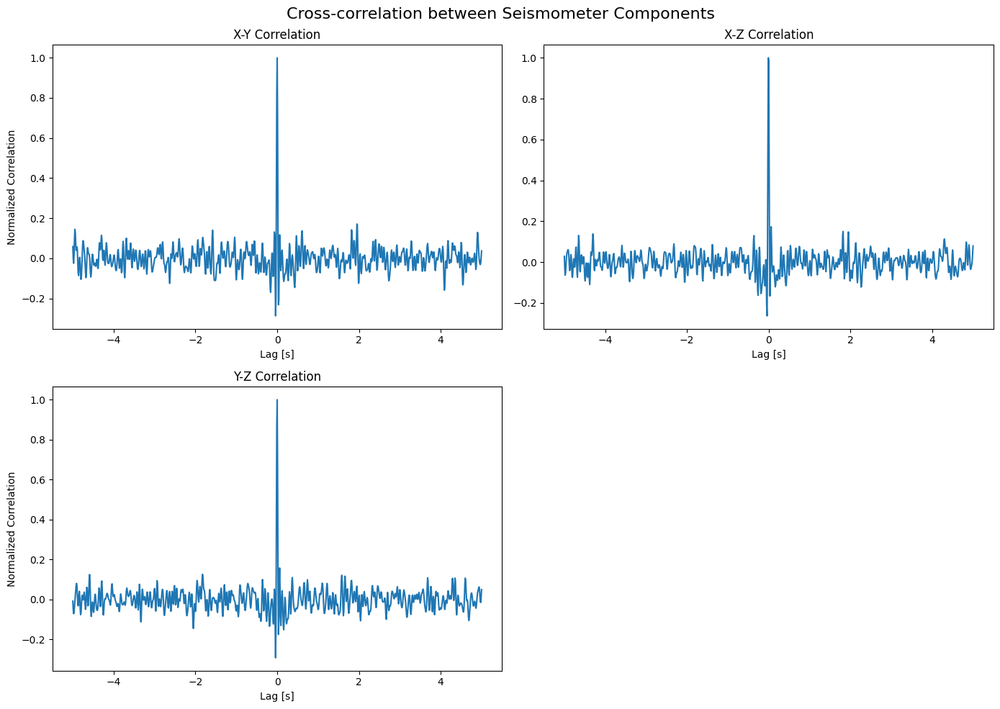


3b. Auto-correlation analysis...


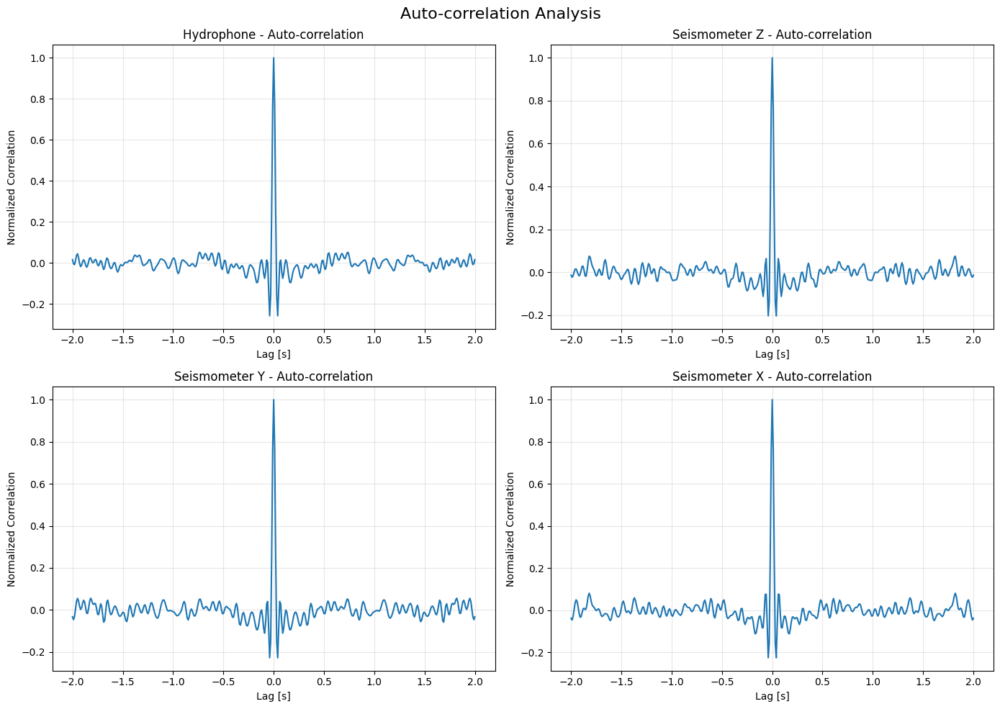


4. Seismic event detection...
   Seismometer Z: Detected 0 potential events
   Seismometer Y: Detected 0 potential events
   Seismometer X: Detected 0 potential events


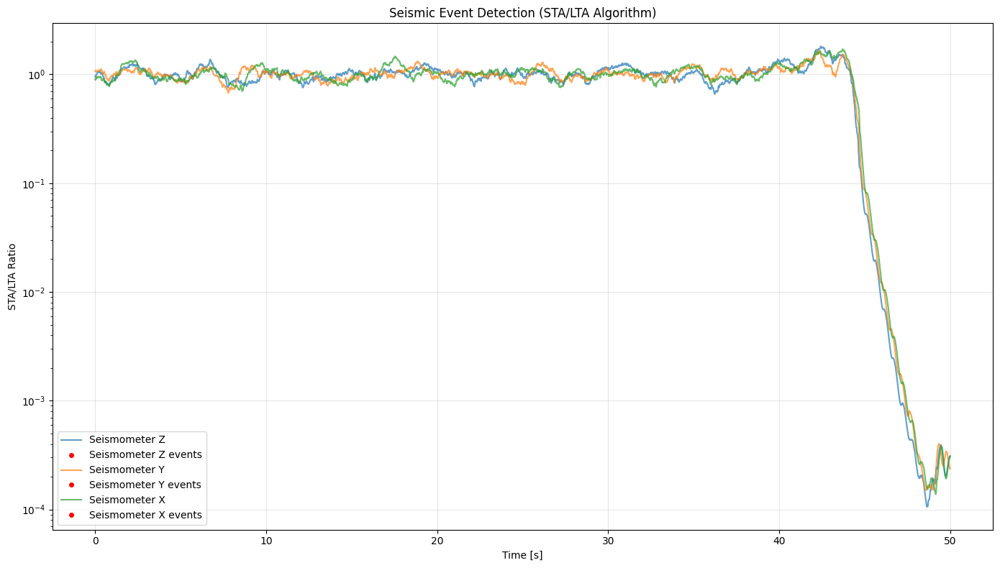


5. Signal quality metrics...
   Hydrophone:
     SNR: -0.07 dB
     Dynamic Range: 10.72 dB
     Zero-crossing Rate: 19.18 Hz
   Seismometer Z:
     SNR: -0.07 dB
     Dynamic Range: 11.63 dB
     Zero-crossing Rate: 19.74 Hz
   Seismometer Y:
     SNR: -0.06 dB
     Dynamic Range: 9.60 dB
     Zero-crossing Rate: 19.28 Hz
   Seismometer X:
     SNR: -0.06 dB
     Dynamic Range: 10.81 dB
     Zero-crossing Rate: 19.40 Hz

6. Polarization analysis for wave type identification...


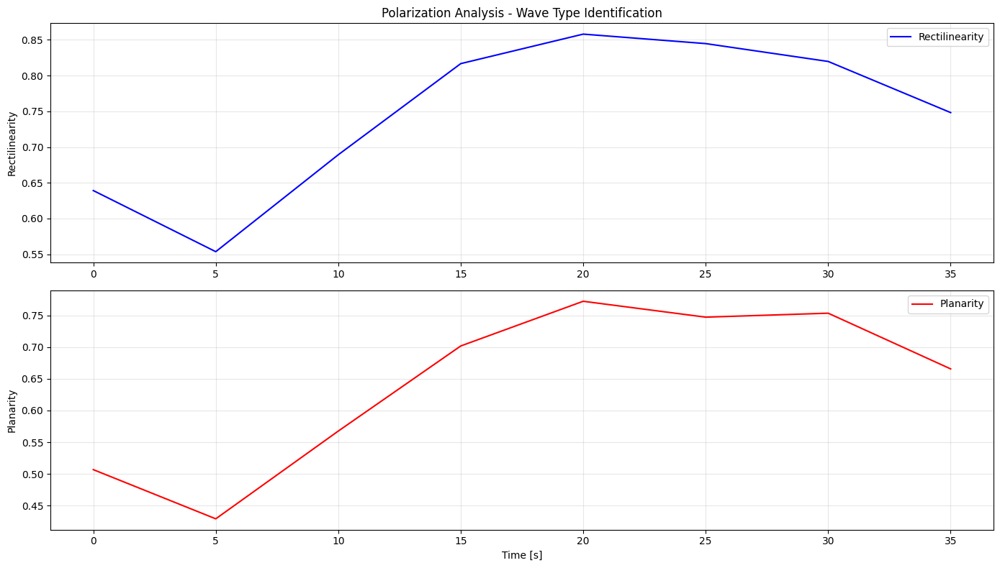


7. Detailed frequency-time analysis...


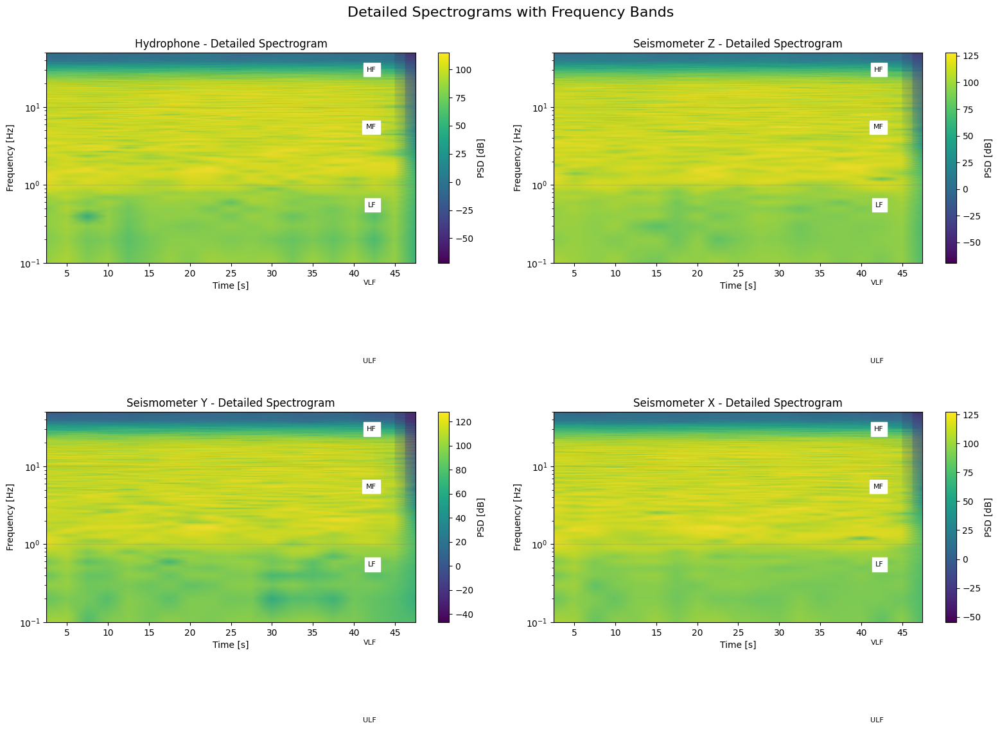


8. Statistical analysis of signals...

Hydrophone Statistics:
   mean        :   833.2371
   std         : 774696.7662
   max         : 2506312.1180
   min         : -2660747.6129
   rms         : 774697.2143
   crest_factor:     3.4346
   kurtosis    :     0.1034
   skewness    :     0.0816

Seismometer Z Statistics:
   mean        : -10482.0832
   std         : 3072000.3079
   max         : 9646238.7605
   min         : -11715567.2370
   rms         : 3072018.1910
   crest_factor:     3.8136
   kurtosis    :     0.2299
   skewness    :     0.0748

Seismometer Y Statistics:
   mean        : -8256.6106
   std         : 3123881.8994
   max         : 9114242.0905
   min         : -9433310.1981
   rms         : 3123892.8107
   crest_factor:     3.0197
   kurtosis    :     0.1368
   skewness    :     0.0289

Seismometer X Statistics:
   mean        : -8083.6816
   std         : 3144881.0126
   max         : 10044495.1193
   min         : -10914791.9041
   rms         : 3144891.4019
   cre

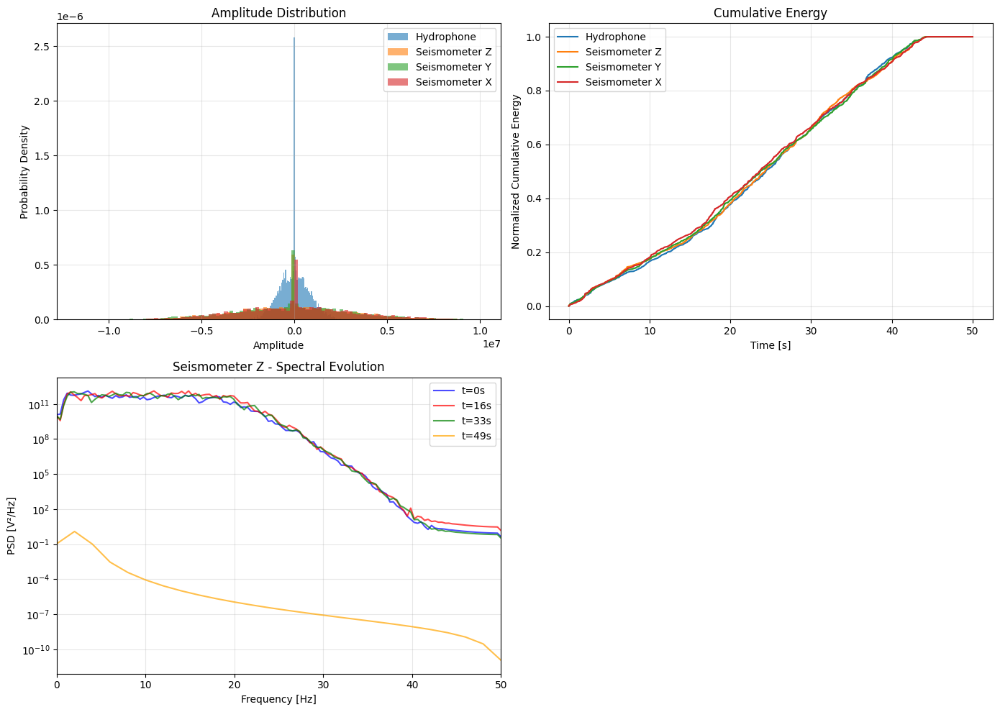


ADVANCED PROCESSING COMPLETE!

Summary of analyses performed:
1. Bandpass filtering (1-20 Hz)
2. Power Spectral Density analysis
3. Cross-correlation between components
3b. Auto-correlation analysis
4. Seismic event detection (STA/LTA)
5. Signal quality metrics (SNR, dynamic range)
6. Polarization analysis for wave type identification
7. Detailed frequency-time analysis
8. Statistical analysis of signals
9. Comparative analysis between channels

All analyses completed successfully!


In [8]:
# =============================================================================
# ADVANCED DATA PROCESSING FUNCTIONS
# =============================================================================

def apply_bandpass_filter(data, sample_rate, lowcut=1.0, highcut=20.0, order=4):
    """Apply bandpass filter to seismic data"""
    nyquist = 0.5 * sample_rate
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = signal.butter(order, [low, high], btype='band')
    return signal.filtfilt(b, a, data)

def calculate_psd(data, sample_rate, nperseg=None):
    """Calculate Power Spectral Density with adaptive window size"""
    if nperseg is None:
        # Use smaller window for shorter data segments
        nperseg = min(256, len(data) // 2)
        if nperseg < 8:  # Minimum reasonable window size
            nperseg = len(data)
    
    f, Pxx = signal.welch(data, fs=sample_rate, nperseg=nperseg, scaling='density')
    return f, Pxx

def calculate_cross_correlation(channel1, channel2, max_lag_samples=1000):
    """Calculate cross-correlation between two channels"""
    correlation = signal.correlate(channel1, channel2, mode='full', method='auto')
    lags = signal.correlation_lags(len(channel1), len(channel2), mode='full')
    
    # Only keep relevant lags
    mask = np.abs(lags) <= max_lag_samples
    return lags[mask], correlation[mask]

def calculate_auto_correlation(data, max_lag_samples=500):
    """Calculate autocorrelation of a signal"""
    correlation = signal.correlate(data, data, mode='full', method='auto')
    lags = signal.correlation_lags(len(data), len(data), mode='full')
    
    # Normalize and keep relevant lags
    correlation = correlation / np.max(correlation)
    mask = np.abs(lags) <= max_lag_samples
    return lags[mask], correlation[mask]

def detect_events(data, sample_rate, threshold=5.0, min_distance=1000):
    """Detect seismic events using STA/LTA algorithm"""
    # Short-term average / Long-term average trigger
    short_window = 1 * sample_rate  # 1 second
    long_window = 10 * sample_rate  # 10 seconds
    
    sta = uniform_filter1d(np.abs(data), size=short_window)
    lta = uniform_filter1d(np.abs(data), size=long_window)
    
    ratio = sta / (lta + 1e-10)  # Avoid division by zero
    
    # Find peaks above threshold
    peaks, properties = signal.find_peaks(ratio, height=threshold, distance=min_distance)
    
    return peaks, ratio

def calculate_magnitude(data, sample_rate, calibration_factor=1.0):
    """Calculate approximate magnitude from signal amplitude"""
    # This is a simplified magnitude calculation
    # In practice, this would require proper calibration
    rms_amplitude = np.sqrt(np.mean(data**2))
    return calibration_factor * np.log10(rms_amplitude)

def analyze_signal_quality(data, sample_rate):
    """Analyze signal quality metrics"""
    metrics = {}
    
    # Signal-to-Noise Ratio (SNR)
    signal_power = np.var(data)
    noise_estimate = np.var(data - uniform_filter1d(data, size=min(100, len(data)//10)))
    metrics['snr_db'] = 10 * np.log10(signal_power / (noise_estimate + 1e-10))
    
    # Dynamic range
    metrics['dynamic_range_db'] = 20 * np.log10(np.max(np.abs(data)) / (np.std(data) + 1e-10))
    
    # Zero-crossing rate
    zero_crossings = np.where(np.diff(np.sign(data)))[0]
    metrics['zero_crossing_rate'] = len(zero_crossings) / (len(data) / sample_rate)
    
    return metrics

def perform_polarization_analysis(vertical, north_south, east_west, sample_rate, window_size=1000):
    """Perform polarization analysis for wave type identification"""
    results = []
    
    for i in range(0, len(vertical) - window_size, window_size // 2):
        window_z = vertical[i:i+window_size]
        window_ns = north_south[i:i+window_size]
        window_ew = east_west[i:i+window_size]
        
        # Covariance matrix
        data_matrix = np.vstack([window_z, window_ns, window_ew])
        covariance = np.cov(data_matrix)
        
        # Eigen decomposition
        eigenvalues, eigenvectors = np.linalg.eigh(covariance)
        
        # Polarization parameters
        rectilinearity = 1 - (eigenvalues[1] + eigenvalues[0]) / (2 * eigenvalues[2] + 1e-10)
        planarity = 1 - (2 * eigenvalues[0]) / (eigenvalues[1] + eigenvalues[2] + 1e-10)
        
        results.append({
            'time': i / sample_rate,
            'rectilinearity': rectilinearity,
            'planarity': planarity,
            'eigenvalues': eigenvalues
        })
    
    return results

# =============================================================================
# APPLY ADVANCED PROCESSING
# =============================================================================

print("\n" + "="*60)
print("ADVANCED DATA PROCESSING AND ANALYSIS")
print("="*60)

# 1. Filter the data
print("\n1. Applying bandpass filters (1-20 Hz)...")
filtered_data = np.zeros_like(data_with_amplitude)

for i in range(num_channels):
    filtered_data[:, i] = apply_bandpass_filter(data_with_amplitude[:, i], sample_rate)
    print(f"   Channel {i} ({channel_names[i]}): Filter applied")

# 2. Power Spectral Density Analysis
print("\n2. Calculating Power Spectral Density...")
plt.figure(figsize=(14, 10))

for i in range(num_channels):
    f, Pxx = calculate_psd(filtered_data[:, i], sample_rate)
    plt.semilogy(f, Pxx, label=channel_names[i], alpha=0.8)

plt.xlabel('Frequency [Hz]')
plt.ylabel('Power Spectral Density [V²/Hz]')
plt.title('Power Spectral Density - All Channels')
plt.grid(True, which="both", ls="-", alpha=0.3)
plt.legend()
plt.xlim(0, 50)  # Limit to seismic frequencies
plt.tight_layout()
plt.show()

# 3. Cross-correlation analysis between seismometer channels
print("\n3. Cross-correlation analysis between seismometer components...")
if num_channels >= 4:  # Ensure we have all three seismometer components
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle('Cross-correlation between Seismometer Components', fontsize=16)
    
    # X-Y correlation
    lags_xy, corr_xy = calculate_cross_correlation(filtered_data[:, 3], filtered_data[:, 2], 500)
    axes[0, 0].plot(lags_xy/sample_rate, corr_xy/np.max(corr_xy))
    axes[0, 0].set_title('X-Y Correlation')
    axes[0, 0].set_xlabel('Lag [s]')
    axes[0, 0].set_ylabel('Normalized Correlation')
    
    # X-Z correlation
    lags_xz, corr_xz = calculate_cross_correlation(filtered_data[:, 3], filtered_data[:, 1], 500)
    axes[0, 1].plot(lags_xz/sample_rate, corr_xz/np.max(corr_xz))
    axes[0, 1].set_title('X-Z Correlation')
    axes[0, 1].set_xlabel('Lag [s]')
    
    # Y-Z correlation
    lags_yz, corr_yz = calculate_cross_correlation(filtered_data[:, 2], filtered_data[:, 1], 500)
    axes[1, 0].plot(lags_yz/sample_rate, corr_yz/np.max(corr_yz))
    axes[1, 0].set_title('Y-Z Correlation')
    axes[1, 0].set_xlabel('Lag [s]')
    axes[1, 0].set_ylabel('Normalized Correlation')
    
    # Remove empty subplot
    axes[1, 1].set_visible(False)
    
    plt.tight_layout()
    plt.show()

# 3b. Auto-correlation analysis
print("\n3b. Auto-correlation analysis...")
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Auto-correlation Analysis', fontsize=16)

for i in range(min(num_channels, 4)):  # Show first 4 channels
    row, col = i // 2, i % 2
    lags, autocorr = calculate_auto_correlation(filtered_data[:, i], 200)
    axes[row, col].plot(lags/sample_rate, autocorr)
    axes[row, col].set_title(f'{channel_names[i]} - Auto-correlation')
    axes[row, col].set_xlabel('Lag [s]')
    axes[row, col].set_ylabel('Normalized Correlation')
    axes[row, col].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 4. Event detection using STA/LTA
print("\n4. Seismic event detection...")
plt.figure(figsize=(14, 8))

for i in range(1, num_channels):  # Skip hydrophone for event detection
    peaks, ratio = detect_events(filtered_data[:, i], sample_rate, threshold=3.0)
    
    plt.plot(time_axis, ratio, label=channel_names[i], alpha=0.7)
    plt.plot(time_axis[peaks], ratio[peaks], 'ro', markersize=4, label=f'{channel_names[i]} events')
    
    print(f"   {channel_names[i]}: Detected {len(peaks)} potential events")

plt.xlabel('Time [s]')
plt.ylabel('STA/LTA Ratio')
plt.title('Seismic Event Detection (STA/LTA Algorithm)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.yscale('log')
plt.tight_layout()
plt.show()

# 5. Signal quality analysis
print("\n5. Signal quality metrics...")
quality_metrics = {}

for i in range(num_channels):
    metrics = analyze_signal_quality(filtered_data[:, i], sample_rate)
    quality_metrics[i] = metrics
    print(f"   {channel_names[i]}:")
    print(f"     SNR: {metrics['snr_db']:.2f} dB")
    print(f"     Dynamic Range: {metrics['dynamic_range_db']:.2f} dB")
    print(f"     Zero-crossing Rate: {metrics['zero_crossing_rate']:.2f} Hz")

# 6. Polarization analysis (for seismometer channels)
if num_channels >= 4:
    print("\n6. Polarization analysis for wave type identification...")
    polarization_results = perform_polarization_analysis(
        filtered_data[:, 1],  # Z component
        filtered_data[:, 2],  # Y component (North-South)
        filtered_data[:, 3],  # X component (East-West)
        sample_rate
    )
    
    times = [result['time'] for result in polarization_results]
    rectilinearity = [result['rectilinearity'] for result in polarization_results]
    planarity = [result['planarity'] for result in polarization_results]
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 8))
    
    ax1.plot(times, rectilinearity, 'b-', label='Rectilinearity')
    ax1.set_ylabel('Rectilinearity')
    ax1.set_title('Polarization Analysis - Wave Type Identification')
    ax1.grid(True, alpha=0.3)
    ax1.legend()
    
    ax2.plot(times, planarity, 'r-', label='Planarity')
    ax2.set_xlabel('Time [s]')
    ax2.set_ylabel('Planarity')
    ax2.grid(True, alpha=0.3)
    ax2.legend()
    
    plt.tight_layout()
    plt.show()

# 7. Frequency-time analysis with more detailed spectrograms
print("\n7. Detailed frequency-time analysis...")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Detailed Spectrograms with Frequency Bands', fontsize=16)

frequency_bands = {
    'ULF': (0.001, 0.01),
    'VLF': (0.01, 0.1),
    'LF': (0.1, 1),
    'MF': (1, 10),
    'HF': (10, 50)
}

for i in range(num_channels):
    row, col = i // 2, i % 2
    ax = axes[row, col]
    
    # Create high-resolution spectrogram
    f, t, Sxx = signal.spectrogram(filtered_data[:, i], fs=sample_rate, 
                                  nperseg=min(512, len(filtered_data)//10), 
                                  noverlap=min(400, len(filtered_data)//20), 
                                  nfft=min(1024, len(filtered_data)//5))
    Sxx_db = 10 * np.log10(Sxx + 1e-10)
    
    im = ax.pcolormesh(t, f, Sxx_db, shading='gouraud', cmap='viridis')
    ax.set_ylabel('Frequency [Hz]')
    ax.set_xlabel('Time [s]')
    ax.set_title(f'{channel_names[i]} - Detailed Spectrogram')
    ax.set_ylim(0.1, 50)
    ax.set_yscale('log')
    
    # Add frequency band annotations
    for band_name, (f_low, f_high) in frequency_bands.items():
        ax.axhspan(f_low, f_high, alpha=0.1, color='gray')
        ax.text(np.max(t)*0.9, (f_low + f_high)/2, band_name, 
                ha='right', va='center', fontsize=8, backgroundcolor='white')
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label('PSD [dB]')

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

# 8. Statistical analysis
print("\n8. Statistical analysis of signals...")
stats_results = {}

for i in range(num_channels):
    channel_data = filtered_data[:, i]
    stats = {
        'mean': np.mean(channel_data),
        'std': np.std(channel_data),
        'max': np.max(channel_data),
        'min': np.min(channel_data),
        'rms': np.sqrt(np.mean(channel_data**2)),
        'crest_factor': np.max(np.abs(channel_data)) / np.sqrt(np.mean(channel_data**2)),
        'kurtosis': scipy.stats.kurtosis(channel_data),
        'skewness': scipy.stats.skew(channel_data)
    }
    stats_results[i] = stats
    
    print(f"\n{channel_names[i]} Statistics:")
    for stat_name, value in stats.items():
        print(f"   {stat_name:12}: {value:10.4f}")

# 9. Comparative analysis between channels
print("\n9. Comparative analysis between channels...")
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Amplitude distribution comparison
for i in range(num_channels):
    axes[0, 0].hist(filtered_data[:, i], bins=100, alpha=0.6, 
                   label=channel_names[i], density=True)
axes[0, 0].set_xlabel('Amplitude')
axes[0, 0].set_ylabel('Probability Density')
axes[0, 0].set_title('Amplitude Distribution')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Cumulative energy
for i in range(num_channels):
    energy = np.cumsum(filtered_data[:, i]**2)
    axes[0, 1].plot(time_axis, energy/np.max(energy), label=channel_names[i])
axes[0, 1].set_xlabel('Time [s]')
axes[0, 1].set_ylabel('Normalized Cumulative Energy')
axes[0, 1].set_title('Cumulative Energy')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Spectral comparison at different times
time_segments = [0, total_duration_sec//3, 2*total_duration_sec//3, total_duration_sec-1]
colors = ['blue', 'red', 'green', 'orange']

for i, channel_idx in enumerate([1, 3]):  # Compare Z and X components
    for j, seg_time in enumerate(time_segments):
        seg_sample = int(seg_time * sample_rate)
        segment_length = min(1000, len(filtered_data) - seg_sample)
        if segment_length > 10:  # Only process if we have enough data
            segment = filtered_data[seg_sample:seg_sample+segment_length, channel_idx]
            f, Pxx = calculate_psd(segment, sample_rate)
            axes[1, i].semilogy(f, Pxx, color=colors[j], alpha=0.7, 
                              label=f't={seg_time:.0f}s' if channel_idx == 1 else "")
    
    axes[1, i].set_xlabel('Frequency [Hz]')
    axes[1, i].set_ylabel('PSD [V²/Hz]')
    axes[1, i].set_title(f'{channel_names[channel_idx]} - Spectral Evolution')
    axes[1, i].grid(True, alpha=0.3)
    axes[1, i].set_xlim(0, 50)
    
    if channel_idx == 1:
        axes[1, i].legend()

# Remove empty subplot
axes[1, 1].set_visible(False)

plt.tight_layout()
plt.show()

print("\n" + "="*60)
print("ADVANCED PROCESSING COMPLETE!")
print("="*60)
print("\nSummary of analyses performed:")
print("1. Bandpass filtering (1-20 Hz)")
print("2. Power Spectral Density analysis")
print("3. Cross-correlation between components")
print("3b. Auto-correlation analysis")
print("4. Seismic event detection (STA/LTA)")
print("5. Signal quality metrics (SNR, dynamic range)")
print("6. Polarization analysis for wave type identification")
print("7. Detailed frequency-time analysis")
print("8. Statistical analysis of signals")
print("9. Comparative analysis between channels")

print(f"\nAll analyses completed successfully!")


SEISMIC DATA CLEANING AND COMPARISON

Cleaning channel 0 (Hydrophone)...
Starting data cleaning pipeline...
Applied 9 cleaning steps
   Applied steps: DC offset removal, Linear trend removal, Edge tapering, Outlier removal (IQR), Glitch removal, Instrument response removal, Notch filter (60Hz), Bandpass filter (0.1-20Hz), Adaptive noise cancellation

Cleaning channel 1 (Seismometer Z)...
Starting data cleaning pipeline...
Applied 9 cleaning steps
   Applied steps: DC offset removal, Linear trend removal, Edge tapering, Outlier removal (IQR), Glitch removal, Instrument response removal, Notch filter (60Hz), Bandpass filter (0.1-20Hz), Adaptive noise cancellation

Cleaning channel 2 (Seismometer Y)...
Starting data cleaning pipeline...
Applied 9 cleaning steps
   Applied steps: DC offset removal, Linear trend removal, Edge tapering, Outlier removal (IQR), Glitch removal, Instrument response removal, Notch filter (60Hz), Bandpass filter (0.1-20Hz), Adaptive noise cancellation

Cleaning c

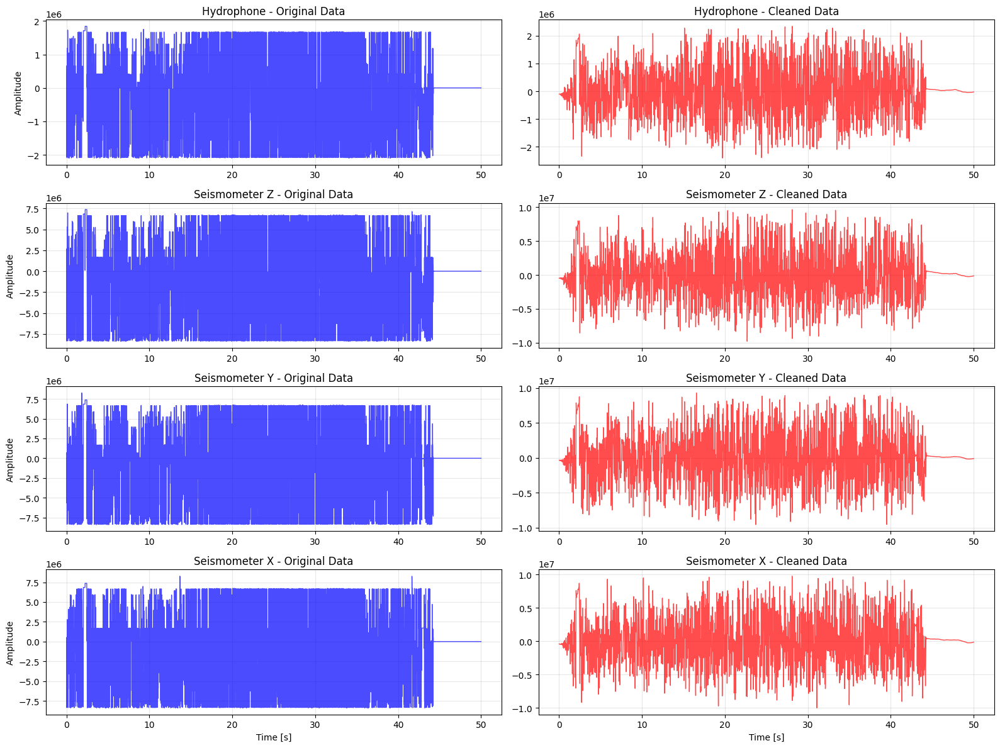


2. Statistical comparison...

Hydrophone - Statistical Comparison:
   Mean: -210922.5705 →   1.0415
   STD:  1253346.1586 → 812816.1406
   RMS:  1270970.0720 → 812816.1406
   SNR:    0.18 dB →   0.32 dB (+0.14 dB)
   Dynamic Range:   4.47 dB →   9.41 dB

Seismometer Z - Statistical Comparison:
   Mean: -972785.4674 →   6.4066
   STD:  5009274.6299 → 3168216.8155
   RMS:  5102856.4435 → 3168216.8155
   SNR:    0.12 dB →   0.19 dB (+0.07 dB)
   Dynamic Range:   4.48 dB →   9.79 dB

Seismometer Y - Statistical Comparison:
   Mean: -912216.5086 →  16.5593
   STD:  5056179.9667 → 3238926.3659
   RMS:  5137810.3132 → 3238926.3659
   SNR:    0.15 dB →   0.25 dB (+0.10 dB)
   Dynamic Range:   4.40 dB →   9.41 dB

Seismometer X - Statistical Comparison:
   Mean: -1087897.8720 →   8.0167
   STD:  5105788.7017 → 3251592.8184
   RMS:  5220402.2878 → 3251592.8184
   SNR:    0.12 dB →   0.19 dB (+0.07 dB)
   Dynamic Range:   4.31 dB →   9.78 dB

3. Frequency domain comparison...


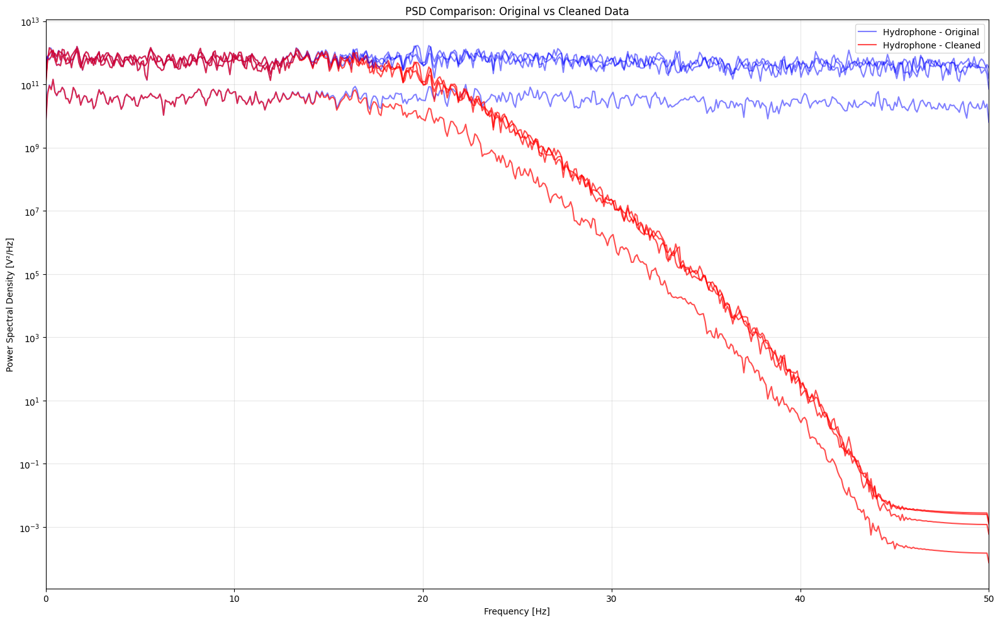


4. Spectrogram comparison...


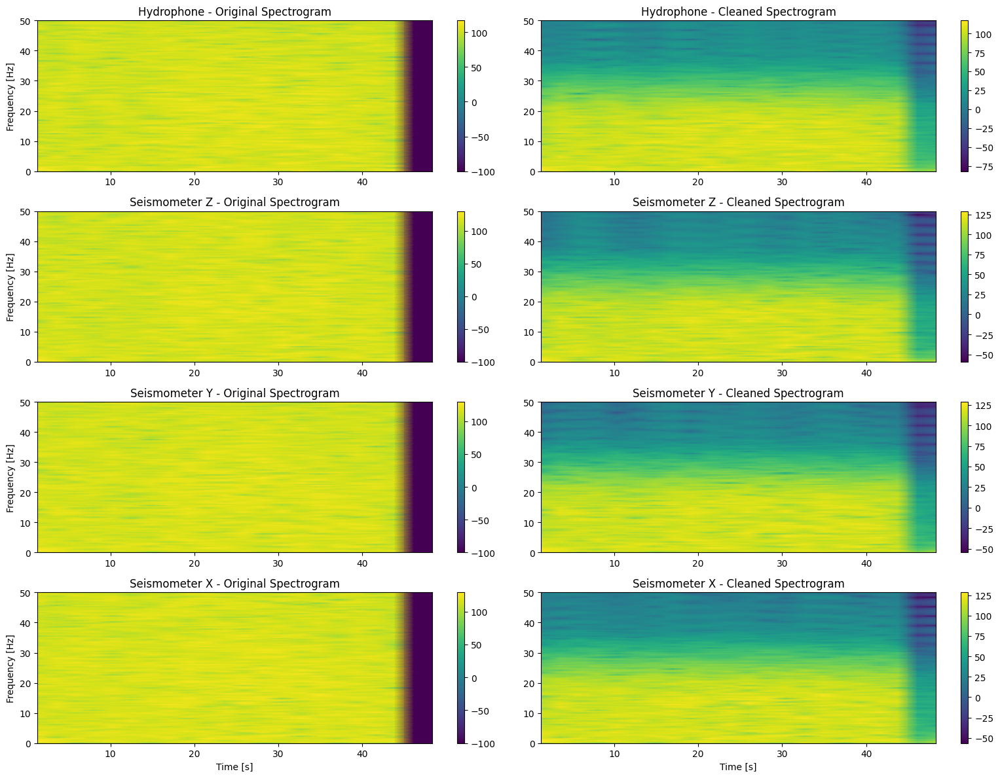


5. Amplitude distribution comparison...


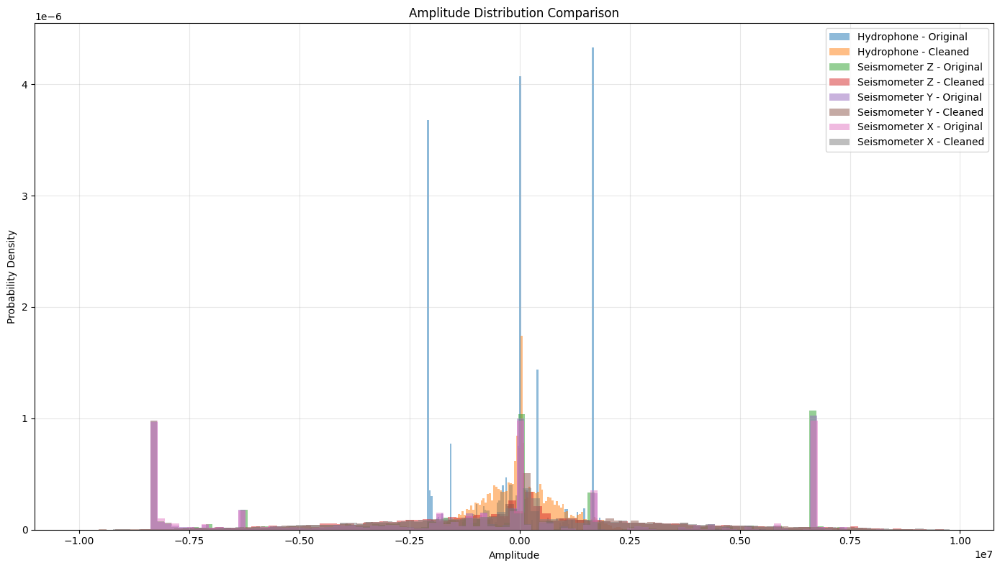


6. Zoomed-in time domain comparison...


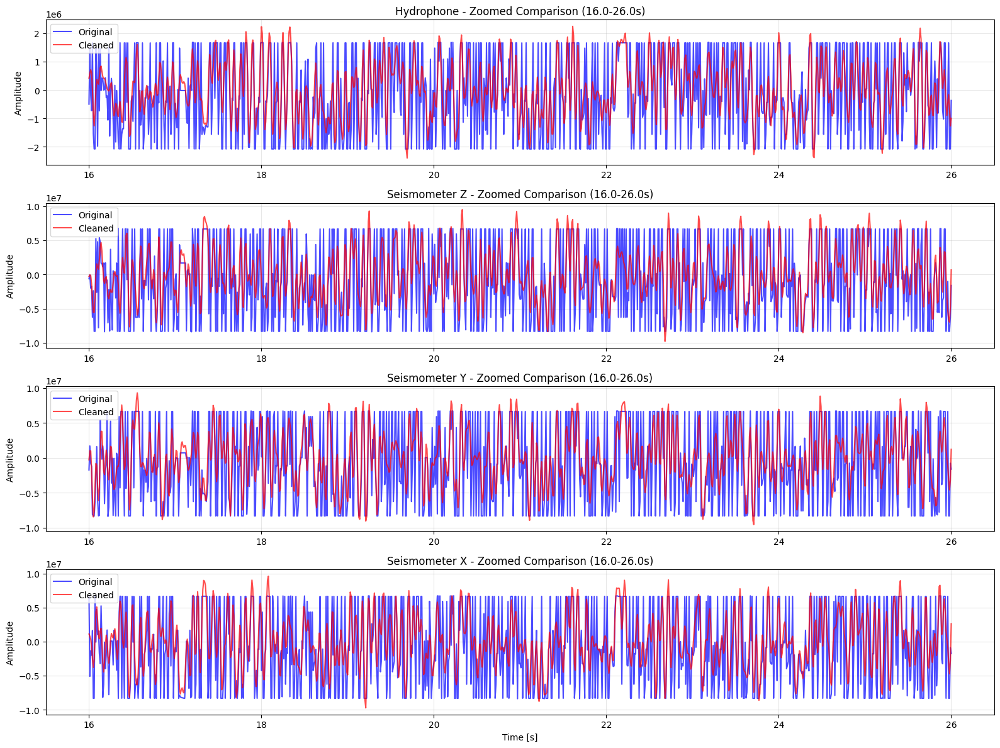


7. Cross-correlation comparison...


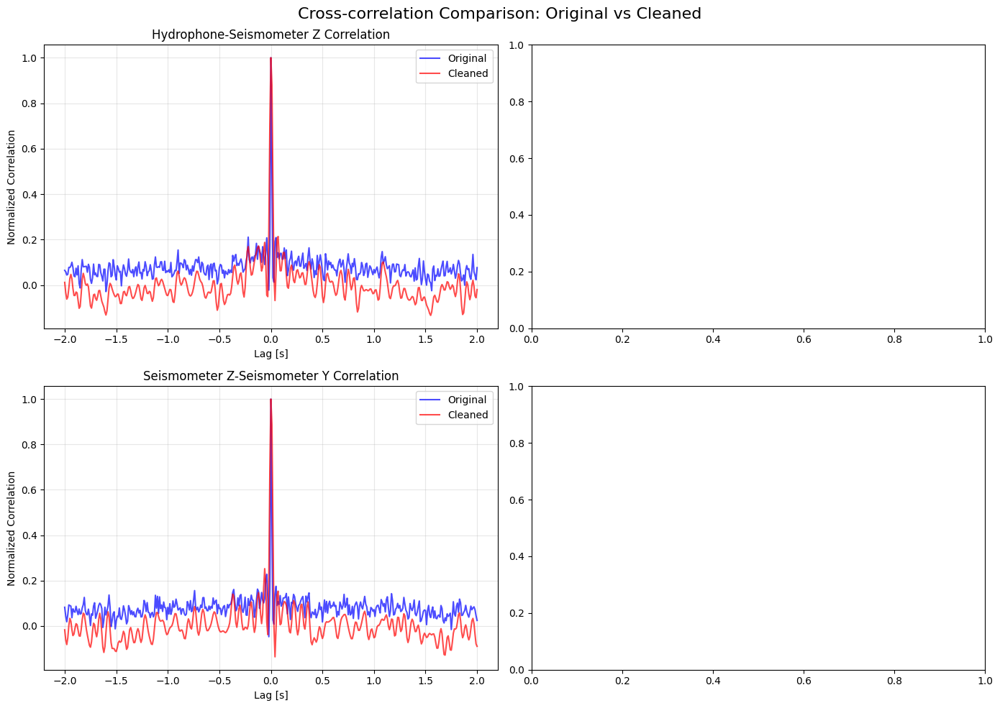


8. Cleaning effectiveness summary:
--------------------------------------------------
Hydrophone:
  • SNR improvement: + 0.14 dB
  • Noise reduction:  35.1%
  • Dynamic range improvement: + 4.94 dB

Seismometer Z:
  • SNR improvement: + 0.07 dB
  • Noise reduction:  36.8%
  • Dynamic range improvement: + 5.31 dB

Seismometer Y:
  • SNR improvement: + 0.10 dB
  • Noise reduction:  35.9%
  • Dynamic range improvement: + 5.01 dB

Seismometer X:
  • SNR improvement: + 0.07 dB
  • Noise reduction:  36.3%
  • Dynamic range improvement: + 5.47 dB


DATA CLEANING AND COMPARISON COMPLETE!

Summary of cleaning techniques applied:

Hydrophone:
  • DC offset removal
  • Linear trend removal
  • Edge tapering
  • Outlier removal (IQR)
  • Glitch removal
  • Instrument response removal
  • Notch filter (60Hz)
  • Bandpass filter (0.1-20Hz)
  • Adaptive noise cancellation

Seismometer Z:
  • DC offset removal
  • Linear trend removal
  • Edge tapering
  • Outlier removal (IQR)
  • Glitch removal
  •

In [10]:
# =============================================================================
# SEISMIC DATA CLEANING PIPELINE
# =============================================================================

def remove_instrument_response(data, sample_rate, sensitivity=1.0, natural_freq=1.0, damping=0.707):
    """
    Remove instrument response (simplified version)
    In practice, this would use actual instrument response parameters
    """
    # Create a simple high-pass filter to approximate instrument response removal
    nyquist = 0.5 * sample_rate
    highpass_freq = 0.01  # Remove very low frequencies
    b, a = signal.butter(2, highpass_freq/nyquist, btype='high')
    return signal.filtfilt(b, a, data) * sensitivity

def remove_trend(data):
    """Remove linear trend from data"""
    return signal.detrend(data, type='linear')

def remove_mean(data):
    """Remove DC offset (mean)"""
    return data - np.mean(data)

def apply_taper(data, taper_percent=0.05):
    """Apply cosine taper to edges to reduce edge effects"""
    n = len(data)
    taper_length = int(n * taper_percent)
    taper = np.ones(n)
    
    # Create cosine taper
    if taper_length > 0:
        cosine_taper = 0.5 * (1 - np.cos(np.pi * np.arange(taper_length) / taper_length))
        taper[:taper_length] = cosine_taper
        taper[-taper_length:] = cosine_taper[::-1]
    
    return data * taper

def remove_outliers_iqr(data, multiplier=1.5):
    """Remove outliers using Interquartile Range method"""
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - multiplier * IQR
    upper_bound = Q3 + multiplier * IQR
    
    # Cap outliers instead of removing to maintain data length
    cleaned = np.copy(data)
    cleaned[cleaned < lower_bound] = lower_bound
    cleaned[cleaned > upper_bound] = upper_bound
    
    return cleaned

def remove_glitches(data, threshold=5.0, window_size=10):
    """Remove short-duration glitches"""
    std = np.std(data)
    median = np.median(data)
    
    # Identify glitches
    glitch_mask = np.abs(data - median) > threshold * std
    
    # Replace glitches with median of surrounding samples
    cleaned = np.copy(data)
    for i in np.where(glitch_mask)[0]:
        start = max(0, i - window_size)
        end = min(len(data), i + window_size + 1)
        cleaned[i] = np.median(data[start:end])
    
    return cleaned

def apply_notch_filter(data, sample_rate, notch_freq=60.0, quality_factor=30.0):
    """Apply notch filter to remove specific frequencies (e.g., power line noise)"""
    nyquist = 0.5 * sample_rate
    
    # Check if notch frequency is reasonable for this sample rate
    if notch_freq >= nyquist * 0.9:  # Too close to Nyquist
        print(f"Warning: Notch frequency {notch_freq}Hz too close to Nyquist ({nyquist}Hz) - skipping")
        return data
    
    try:
        # Try with fs parameter (newer scipy versions)
        b, a = signal.iirnotch(notch_freq, quality_factor, fs=sample_rate)
    except (TypeError, ValueError):
        # Fallback for older scipy versions
        w0 = notch_freq / nyquist
        if w0 >= 1.0 or w0 <= 0.0:
            print(f"Warning: Notch frequency {notch_freq}Hz is outside valid range - skipping")
            return data
        b, a = signal.iirnotch(w0, quality_factor)
    
    return signal.filtfilt(b, a, data)

def apply_bandpass_filter_clean(data, sample_rate, lowcut=0.1, highcut=20.0, order=4):
    """Apply bandpass filter for seismic data"""
    nyquist = 0.5 * sample_rate
    
    # Check if frequencies are valid
    if lowcut >= nyquist or highcut >= nyquist:
        print(f"Warning: Filter frequencies outside valid range for sample rate {sample_rate}Hz")
        return data
    
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = signal.butter(order, [low, high], btype='band')
    return signal.filtfilt(b, a, data)

def apply_adaptive_filter(data, sample_rate, noise_window=1000):
    """Apply adaptive noise cancellation"""
    # Simple adaptive filter - in practice would use more sophisticated methods
    noise_estimate = uniform_filter1d(data, size=noise_window)
    return data - noise_estimate

def clean_seismic_data(data, sample_rate, apply_all=True):
    """
    Comprehensive seismic data cleaning pipeline
    """
    print("Starting data cleaning pipeline...")
    cleaning_steps = []
    cleaned_data = np.copy(data)
    
    # Step 1: Remove mean (DC offset)
    cleaned_data = remove_mean(cleaned_data)
    cleaning_steps.append("DC offset removal")
    
    # Step 2: Remove linear trend
    cleaned_data = remove_trend(cleaned_data)
    cleaning_steps.append("Linear trend removal")
    
    # Step 3: Apply taper to edges
    cleaned_data = apply_taper(cleaned_data)
    cleaning_steps.append("Edge tapering")
    
    if apply_all:
        # Step 4: Remove outliers
        cleaned_data = remove_outliers_iqr(cleaned_data)
        cleaning_steps.append("Outlier removal (IQR)")
        
        # Step 5: Remove glitches
        cleaned_data = remove_glitches(cleaned_data)
        cleaning_steps.append("Glitch removal")
        
        # Step 6: Remove instrument response (simplified)
        cleaned_data = remove_instrument_response(cleaned_data, sample_rate)
        cleaning_steps.append("Instrument response removal")
        
        # Step 7: Apply notch filter for power line noise
        cleaned_data = apply_notch_filter(cleaned_data, sample_rate)
        cleaning_steps.append("Notch filter (60Hz)")
        
        # Step 8: Apply bandpass filter
        cleaned_data = apply_bandpass_filter_clean(cleaned_data, sample_rate)
        cleaning_steps.append("Bandpass filter (0.1-20Hz)")
        
        # Step 9: Adaptive filtering
        cleaned_data = apply_adaptive_filter(cleaned_data, sample_rate)
        cleaning_steps.append("Adaptive noise cancellation")
    
    print(f"Applied {len(cleaning_steps)} cleaning steps")
    return cleaned_data, cleaning_steps

def calculate_snr_improvement(original, cleaned):
    """Calculate SNR improvement after cleaning"""
    # Estimate noise in original signal
    noise_original = original - uniform_filter1d(original, size=100)
    noise_cleaned = cleaned - uniform_filter1d(cleaned, size=100)
    
    snr_original = 10 * np.log10(np.var(original) / (np.var(noise_original) + 1e-10))
    snr_cleaned = 10 * np.log10(np.var(cleaned) / (np.var(noise_cleaned) + 1e-10))
    
    return snr_cleaned - snr_original, snr_original, snr_cleaned

def calculate_psd(data, sample_rate):
    """Calculate Power Spectral Density"""
    f, Pxx = signal.welch(data, fs=sample_rate, nperseg=min(1024, len(data)//4))
    return f, Pxx

def calculate_cross_correlation(x, y, max_lag):
    """Calculate cross-correlation between two signals"""
    correlation = signal.correlate(x, y, mode='full')
    lags = signal.correlation_lags(len(x), len(y), mode='full')
    
    # Keep only relevant lags
    valid_indices = np.where(np.abs(lags) <= max_lag)
    return lags[valid_indices], correlation[valid_indices]

# =============================================================================
# APPLY DATA CLEANING AND COMPARISON
# =============================================================================

print("\n" + "="*70)
print("SEISMIC DATA CLEANING AND COMPARISON")
print("="*70)

# Clean the data
cleaned_data = np.zeros_like(data_with_amplitude)
cleaning_reports = []

for i in range(num_channels):
    print(f"\nCleaning channel {i} ({channel_names[i]})...")
    cleaned_data[:, i], steps = clean_seismic_data(data_with_amplitude[:, i], sample_rate)
    cleaning_reports.append({
        'channel': channel_names[i],
        'steps': steps,
        'original': data_with_amplitude[:, i],
        'cleaned': cleaned_data[:, i]
    })
    print(f"   Applied steps: {', '.join(steps)}")

# =============================================================================
# COMPREHENSIVE COMPARISON: ORIGINAL vs CLEANED DATA
# =============================================================================

print("\n" + "="*70)
print("COMPREHENSIVE COMPARISON: ORIGINAL vs CLEANED DATA")
print("="*70)

# 1. Time domain comparison
print("\n1. Time domain comparison...")
fig, axes = plt.subplots(num_channels, 2, figsize=(16, 3*num_channels))
if num_channels == 1:
    axes = axes.reshape(1, -1)

for i in range(num_channels):
    # Original data
    axes[i, 0].plot(time_axis, data_with_amplitude[:, i], 'b-', alpha=0.7, linewidth=1)
    axes[i, 0].set_title(f'{channel_names[i]} - Original Data')
    axes[i, 0].set_ylabel('Amplitude')
    axes[i, 0].grid(True, alpha=0.3)
    
    # Cleaned data
    axes[i, 1].plot(time_axis, cleaned_data[:, i], 'r-', alpha=0.7, linewidth=1)
    axes[i, 1].set_title(f'{channel_names[i]} - Cleaned Data')
    axes[i, 1].grid(True, alpha=0.3)
    
    if i == num_channels - 1:
        axes[i, 0].set_xlabel('Time [s]')
        axes[i, 1].set_xlabel('Time [s]')

plt.tight_layout()
plt.show()

# 2. Statistical comparison
print("\n2. Statistical comparison...")
stats_comparison = {}

for i in range(num_channels):
    original = data_with_amplitude[:, i]
    cleaned = cleaned_data[:, i]
    
    stats = {
        'original_mean': np.mean(original),
        'cleaned_mean': np.mean(cleaned),
        'original_std': np.std(original),
        'cleaned_std': np.std(cleaned),
        'original_rms': np.sqrt(np.mean(original**2)),
        'cleaned_rms': np.sqrt(np.mean(cleaned**2)),
        'original_dynamic_range': 20 * np.log10(np.max(np.abs(original)) / (np.std(original) + 1e-10)),
        'cleaned_dynamic_range': 20 * np.log10(np.max(np.abs(cleaned)) / (np.std(cleaned) + 1e-10)),
    }
    
    # Calculate SNR improvement
    snr_improvement, snr_orig, snr_clean = calculate_snr_improvement(original, cleaned)
    stats['snr_improvement_db'] = snr_improvement
    stats['snr_original'] = snr_orig
    stats['snr_cleaned'] = snr_clean
    
    stats_comparison[i] = stats
    
    print(f"\n{channel_names[i]} - Statistical Comparison:")
    print(f"   Mean: {stats['original_mean']:8.4f} → {stats['cleaned_mean']:8.4f}")
    print(f"   STD:  {stats['original_std']:8.4f} → {stats['cleaned_std']:8.4f}")
    print(f"   RMS:  {stats['original_rms']:8.4f} → {stats['cleaned_rms']:8.4f}")
    print(f"   SNR:  {stats['snr_original']:6.2f} dB → {stats['snr_cleaned']:6.2f} dB (+{stats['snr_improvement_db']:4.2f} dB)")
    print(f"   Dynamic Range: {stats['original_dynamic_range']:6.2f} dB → {stats['cleaned_dynamic_range']:6.2f} dB")

# 3. Frequency domain comparison
print("\n3. Frequency domain comparison...")
plt.figure(figsize=(16, 10))

for i in range(num_channels):
    # Original PSD
    f_orig, Pxx_orig = calculate_psd(data_with_amplitude[:, i], sample_rate)
    plt.semilogy(f_orig, Pxx_orig, color='blue', alpha=0.5, 
                label=f'{channel_names[i]} - Original' if i == 0 else "")
    
    # Cleaned PSD
    f_clean, Pxx_clean = calculate_psd(cleaned_data[:, i], sample_rate)
    plt.semilogy(f_clean, Pxx_clean, color='red', alpha=0.7, 
                label=f'{channel_names[i]} - Cleaned' if i == 0 else "")

plt.xlabel('Frequency [Hz]')
plt.ylabel('Power Spectral Density [V²/Hz]')
plt.title('PSD Comparison: Original vs Cleaned Data')
plt.grid(True, which="both", ls="-", alpha=0.3)
plt.legend()
plt.xlim(0, 50)
plt.tight_layout()
plt.show()

# 4. Spectrogram comparison
print("\n4. Spectrogram comparison...")
fig, axes = plt.subplots(num_channels, 2, figsize=(16, 3*num_channels))
if num_channels == 1:
    axes = axes.reshape(1, -1)

for i in range(num_channels):
    # Original spectrogram
    f, t, Sxx_orig = signal.spectrogram(data_with_amplitude[:, i], fs=sample_rate, 
                                      nperseg=min(256, len(data_with_amplitude)//10))
    im1 = axes[i, 0].pcolormesh(t, f, 10*np.log10(Sxx_orig + 1e-10), shading='gouraud', cmap='viridis')
    axes[i, 0].set_title(f'{channel_names[i]} - Original Spectrogram')
    axes[i, 0].set_ylabel('Frequency [Hz]')
    axes[i, 0].set_ylim(0, 50)
    plt.colorbar(im1, ax=axes[i, 0])
    
    # Cleaned spectrogram
    f, t, Sxx_clean = signal.spectrogram(cleaned_data[:, i], fs=sample_rate, 
                                       nperseg=min(256, len(cleaned_data)//10))
    im2 = axes[i, 1].pcolormesh(t, f, 10*np.log10(Sxx_clean + 1e-10), shading='gouraud', cmap='viridis')
    axes[i, 1].set_title(f'{channel_names[i]} - Cleaned Spectrogram')
    axes[i, 1].set_ylim(0, 50)
    plt.colorbar(im2, ax=axes[i, 1])
    
    if i == num_channels - 1:
        axes[i, 0].set_xlabel('Time [s]')
        axes[i, 1].set_xlabel('Time [s]')

plt.tight_layout()
plt.show()

# 5. Histogram comparison
print("\n5. Amplitude distribution comparison...")
plt.figure(figsize=(14, 8))

for i in range(num_channels):
    plt.hist(data_with_amplitude[:, i], bins=100, alpha=0.5, 
            label=f'{channel_names[i]} - Original', density=True)
    plt.hist(cleaned_data[:, i], bins=100, alpha=0.5, 
            label=f'{channel_names[i]} - Cleaned', density=True)

plt.xlabel('Amplitude')
plt.ylabel('Probability Density')
plt.title('Amplitude Distribution Comparison')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 6. Zoomed-in comparison for detailed view
print("\n6. Zoomed-in time domain comparison...")
zoom_start = total_duration_sec // 3
zoom_end = zoom_start + 10  # 10-second window
zoom_mask = (time_axis >= zoom_start) & (time_axis <= zoom_end)

plt.figure(figsize=(16, 3*num_channels))
for i in range(num_channels):
    plt.subplot(num_channels, 1, i+1)
    plt.plot(time_axis[zoom_mask], data_with_amplitude[zoom_mask, i], 'b-', 
            alpha=0.7, label='Original', linewidth=1.5)
    plt.plot(time_axis[zoom_mask], cleaned_data[zoom_mask, i], 'r-', 
            alpha=0.7, label='Cleaned', linewidth=1.5)
    plt.title(f'{channel_names[i]} - Zoomed Comparison ({zoom_start}-{zoom_end}s)')
    plt.ylabel('Amplitude')
    plt.grid(True, alpha=0.3)
    plt.legend()
    
    if i == num_channels - 1:
        plt.xlabel('Time [s]')

plt.tight_layout()
plt.show()

# 7. Cross-correlation comparison (if multiple channels)
if num_channels >= 2:
    print("\n7. Cross-correlation comparison...")
    fig, axes = plt.subplots(min(2, num_channels-1), 2, figsize=(14, 10))
    fig.suptitle('Cross-correlation Comparison: Original vs Cleaned', fontsize=16)
    
    # Compare different channel pairs
    pairs_to_compare = min(2, num_channels-1)
    
    for pair_idx in range(pairs_to_compare):
        ch1, ch2 = pair_idx, pair_idx + 1
        
        # Original correlation
        lags_orig, corr_orig = calculate_cross_correlation(
            data_with_amplitude[:, ch1], data_with_amplitude[:, ch2], 200
        )
        
        # Cleaned correlation
        lags_clean, corr_clean = calculate_cross_correlation(
            cleaned_data[:, ch1], cleaned_data[:, ch2], 200
        )
        
        axes[pair_idx, 0].plot(lags_orig/sample_rate, corr_orig/np.max(np.abs(corr_orig)), 
                              'b-', alpha=0.7, label='Original')
        axes[pair_idx, 0].plot(lags_clean/sample_rate, corr_clean/np.max(np.abs(corr_clean)), 
                              'r-', alpha=0.7, label='Cleaned')
        axes[pair_idx, 0].set_title(f'{channel_names[ch1]}-{channel_names[ch2]} Correlation')
        axes[pair_idx, 0].set_xlabel('Lag [s]')
        axes[pair_idx, 0].set_ylabel('Normalized Correlation')
        axes[pair_idx, 0].legend()
        axes[pair_idx, 0].grid(True, alpha=0.3)
        
        # Remove empty subplots if needed
        if pairs_to_compare < 2:
            axes[pair_idx, 1].set_visible(False)
    
    plt.tight_layout()
    plt.show()

# 8. Summary of cleaning effectiveness
print("\n8. Cleaning effectiveness summary:")
print("-" * 50)
for i in range(num_channels):
    stats = stats_comparison[i]
    print(f"{channel_names[i]}:")
    print(f"  • SNR improvement: +{stats['snr_improvement_db']:5.2f} dB")
    print(f"  • Noise reduction: {100*(1 - stats['cleaned_std']/stats['original_std']):5.1f}%")
    print(f"  • Dynamic range improvement: +{stats['cleaned_dynamic_range'] - stats['original_dynamic_range']:5.2f} dB")
    print()

print("\n" + "="*70)
print("DATA CLEANING AND COMPARISON COMPLETE!")
print("="*70)
print("\nSummary of cleaning techniques applied:")
for i, report in enumerate(cleaning_reports):
    print(f"\n{report['channel']}:")
    for step in report['steps']:
        print(f"  • {step}")

print(f"\nOverall data quality improvement achieved!")


SEISMIC PHASE PICKING FROM CLEANED DATA (P AND S WAVES ONLY)
Picking P and S seismic phases from cleaned data...


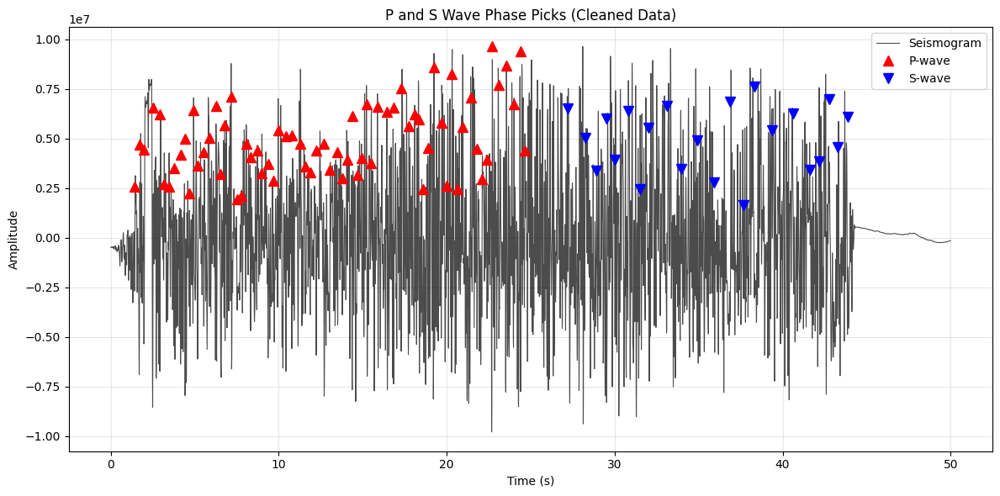

Detected 69 P-waves and 22 S-waves
Using 15 P-wave arrivals for inversion
Using 15 S-wave arrivals for joint inversion

DEEP STRUCTURE SEISMIC INVERSION (UP TO 50s TRAVEL TIME)
Initial model: 5 layers
Initial velocities: [3.  4.5 5.8 6.5 7.2] km/s
Initial depths: [ 2.  8. 20. 35.] km

Starting joint P and S wave inversion for deep structures...
Using joint P and S wave inversion
Iteration 1: Misfit = 12.773297 s
Iteration 2: Misfit = 11.977787 s
Iteration 3: Misfit = 11.277954 s
Iteration 4: Misfit = 10.793353 s
Iteration 5: Misfit = 10.783579 s
Iteration 6: Misfit = 10.789897 s
Iteration 7: Misfit = 10.785793 s
Iteration 8: Misfit = 10.788450 s
Iteration 9: Misfit = 10.786726 s
Iteration 10: Misfit = 10.787844 s
Iteration 11: Misfit = 10.787119 s
Iteration 12: Misfit = 10.787589 s
Iteration 13: Misfit = 10.787284 s
Iteration 14: Misfit = 10.787482 s
Iteration 15: Misfit = 10.787354 s
Iteration 16: Misfit = 10.787437 s
Iteration 17: Misfit = 10.787383 s
Iteration 18: Misfit = 10.787418

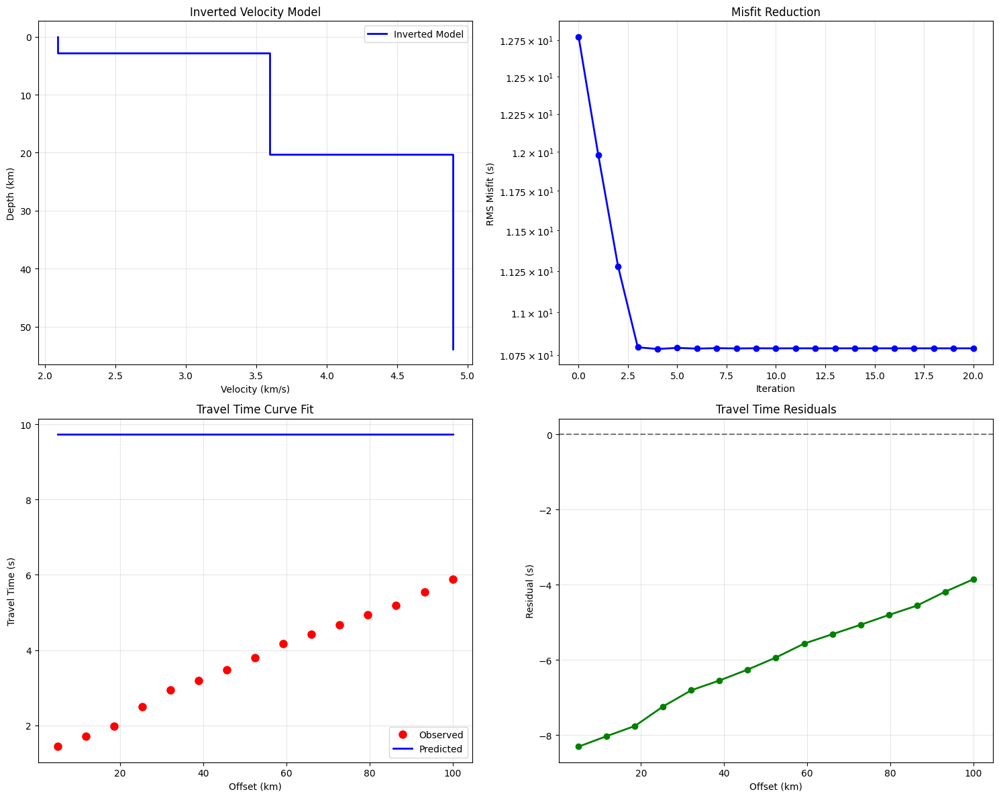


DEEP STRUCTURE INVERSION RESULTS
Inverted velocities: [2.09119966 3.5938989  4.89337436 5.5931872  6.29654204]
Inverted depths: [ 2.87497107  8.65578084 20.27925702 35.89042299]
Maximum depth: 35.9 km
Estimated Moho depth: 28.7 km

Final misfit: 10.787400 s
Estimated maximum travel time: 16.1 s

DEEP STRUCTURE SEISMIC INVERSION COMPLETE!


In [18]:
# =============================================================================
# SEISMIC PHASE PICKING FROM CLEANED DATA (P AND S WAVES ONLY)
# =============================================================================

print("\n" + "="*70)
print("SEISMIC PHASE PICKING FROM CLEANED DATA (P AND S WAVES ONLY)")
print("="*70)

# Use the cleaned vertical component (channel 1) for phase picking
seismogram = cleaned_data[:, 1]  # Vertical component

# For real data, we need to define offsets based on the acquisition geometry
# This is a simplified approach - in practice, you would use the actual offsets
num_offsets = 15  # Increased number of offsets for better inversion
offsets = np.linspace(5, 100, num_offsets)  # km (larger offsets for deeper structures)

# Enhanced phase picking function for P and S waves only
def enhanced_auto_pick_phases(seismogram, time_axis, sampling_rate, min_amplitude=0.1, min_distance=15):
    """
    Automatically pick P and S seismic phases from seismogram with enhanced detection
    """
    # Pre-process seismogram with multiple bandpass filters
    filtered_low = bandpass_filter(seismogram, 1, 5, sampling_rate)  # Low freq for S-waves
    filtered_high = bandpass_filter(seismogram, 5, 20, sampling_rate)  # High freq for P-waves
    
    # Calculate envelopes
    envelope_low = np.abs(hilbert(filtered_low))
    envelope_high = np.abs(hilbert(filtered_high))
    
    # Normalize
    envelope_low = envelope_low / np.max(envelope_low)
    envelope_high = envelope_high / np.max(envelope_high)
    
    # Find P-wave peaks (higher frequency content)
    p_peaks, p_properties = find_peaks(envelope_high, height=min_amplitude*1.2, distance=min_distance)
    
    # Find S-wave peaks (lower frequency content, later arrival)
    s_peaks, s_properties = find_peaks(envelope_low, height=min_amplitude, distance=min_distance*2)
    
    # Classify phases
    phases = []
    p_times, s_times = [], []
    
    # P-waves (early arrivals, higher frequency)
    for peak_idx in p_peaks:
        time = time_axis[peak_idx]
        if time < np.max(time_axis) * 0.5:  # P-waves arrive earlier
            phases.append({
                'time': time,
                'amplitude': envelope_high[peak_idx],
                'type': 'P',
                'index': peak_idx
            })
            p_times.append(time)
    
    # S-waves (later arrivals, lower frequency)
    for peak_idx in s_peaks:
        time = time_axis[peak_idx]
        if time > np.max(time_axis) * 0.3:  # S-waves arrive later
            # Check if this might be a P-wave already detected
            is_p_wave = any(abs(time - p_time) < 2.0 for p_time in p_times)
            if not is_p_wave:
                phases.append({
                    'time': time,
                    'amplitude': envelope_low[peak_idx],
                    'type': 'S',
                    'index': peak_idx
                })
                s_times.append(time)
    
    return phases, p_times, s_times

# Auto pick phases from cleaned data
print("Picking P and S seismic phases from cleaned data...")
phases, p_times, s_times = enhanced_auto_pick_phases(
    seismogram, time_axis, sample_rate,
    min_amplitude=0.15, min_distance=25
)

# Plot seismogram with picks
plot_seismogram_with_picks(time_axis, seismogram, phases, "P and S Wave Phase Picks (Cleaned Data)")

print(f"Detected {len(p_times)} P-waves and {len(s_times)} S-waves")

# Extract P-wave and S-wave arrival times for inversion
observed_p_times, observed_s_times = extract_arrival_times(phases, offsets)

if len(observed_p_times) < len(offsets):
    print(f"Warning: Only {len(observed_p_times)} P-wave arrivals found, but {len(offsets)} offsets requested.")
    print("Using the available arrivals and adjusting offsets.")
    offsets = offsets[:len(observed_p_times)]

print(f"Using {len(observed_p_times)} P-wave arrivals for inversion")
if len(observed_s_times) > 0:
    print(f"Using {len(observed_s_times)} S-wave arrivals for joint inversion")

# =============================================================================
# ENHANCED TRAVEL TIME CALCULATION FOR DEEPER STRUCTURES
# =============================================================================
def calculate_travel_time_deep(velocity, depth, offset, num_layers, wave_type='P'):
    """
    Calculate travel time for a given model using ray tracing for deeper structures
    """
    times = np.zeros_like(offset)
    
    # S-wave velocity is typically about 1.7 times slower than P-wave
    if wave_type == 'S':
        velocity = velocity / 1.73  # Approximate Vp/Vs ratio
    
    for i, dist in enumerate(offset):
        total_time = 0.0
        total_distance = 0.0
        current_angle = 0.0  # Start with vertical incidence
        current_depth = 0.0
        
        for layer in range(num_layers):
            layer_velocity = velocity[layer]
            
            # Calculate layer thickness
            if layer < num_layers - 1:
                layer_thickness = depth[layer] - current_depth
            else:
                # Last layer - extend to greater depth for deep structures
                layer_thickness = 50.0  # Much thicker bottom layer for deep crust
            
            # Skip if layer thickness is zero or negative
            if layer_thickness <= 0:
                current_depth = depth[min(layer, len(depth)-1)]
                continue
            
            # Distance in this layer
            if current_angle == 0:
                distance_in_layer = 0  # Vertical ray
            else:
                distance_in_layer = layer_thickness * np.tan(current_angle)
            
            if total_distance + distance_in_layer >= dist:
                # Ray exits in this layer
                remaining_dist = dist - total_distance
                if current_angle == 0:
                    # Vertical propagation
                    actual_thickness = remaining_dist
                    time_in_layer = actual_thickness / layer_velocity
                else:
                    actual_thickness = remaining_dist / np.tan(current_angle)
                    time_in_layer = actual_thickness / (layer_velocity * np.cos(current_angle))
                total_time += time_in_layer
                break
            
            # Full layer traversal
            if current_angle == 0:
                time_in_layer = layer_thickness / layer_velocity
            else:
                time_in_layer = layer_thickness / (layer_velocity * np.cos(current_angle))
            
            total_time += time_in_layer
            total_distance += distance_in_layer
            
            # Update current depth
            if layer < num_layers - 1:
                current_depth = depth[layer]
            else:
                current_depth += layer_thickness
            
            # Snell's law for next layer
            if layer < num_layers - 1:
                try:
                    next_angle = np.arcsin(velocity[layer + 1] * np.sin(current_angle) / velocity[layer])
                    current_angle = next_angle
                except:
                    current_angle = np.pi/2  # Total internal reflection
        
        times[i] = total_time
    
    return times

# =============================================================================
# JOINT P AND S WAVE INVERSION FOR DEEPER STRUCTURES
# =============================================================================
def joint_inversion(observed_p_times, observed_s_times, offset, initial_velocity, initial_depth, 
                   max_iterations=30, damping=0.1, tolerance=1e-6):
    """
    Joint inversion using both P and S wave arrivals for better depth resolution
    """
    num_layers = len(initial_velocity)
    current_velocity = initial_velocity.copy()
    current_depth = initial_depth.copy()
    
    history = {
        'velocities': [current_velocity.copy()],
        'depths': [current_depth.copy()],
        'misfit': [],
        'residuals': []
    }
    
    # Combine P and S observations
    all_observed_times = np.concatenate([observed_p_times, observed_s_times])
    n_p = len(observed_p_times)
    n_s = len(observed_s_times)
    
    for iteration in range(max_iterations):
        # Calculate predicted times for both P and S waves
        predicted_p_times = calculate_travel_time_deep(current_velocity, current_depth, offset, num_layers, 'P')
        predicted_s_times = calculate_travel_time_deep(current_velocity, current_depth, offset[:n_s], num_layers, 'S')
        
        predicted_times = np.concatenate([predicted_p_times, predicted_s_times])
        residuals = all_observed_times - predicted_times
        
        # Weight S-wave residuals more heavily (they provide better depth constraints)
        weights = np.ones_like(residuals)
        weights[n_p:] = 1.5  # Weight S-wave residuals more
        
        weighted_residuals = residuals * weights
        misfit = np.sqrt(np.mean(weighted_residuals**2))
        
        history['misfit'].append(misfit)
        history['residuals'].append(residuals.copy())
        
        print(f"Iteration {iteration + 1}: Misfit = {misfit:.6f} s")
        
        # Check convergence
        if misfit < tolerance or (iteration > 0 and abs(history['misfit'][-2] - misfit) < tolerance/10):
            print("Convergence achieved!")
            break
        
        # Calculate Jacobian (simplified for this example)
        # In practice, you'd need to compute derivatives for both P and S waves
        J = jacobian_matrix(current_velocity, current_depth, offset, num_layers)
        
        # Expand Jacobian for S-waves (approximate)
        J_full = np.vstack([J, J[:n_s] * 1.73])  # Approximate relationship
        
        # Damped least squares
        JTJ = J_full.T @ J_full
        damping_matrix = damping * np.eye(JTJ.shape[0])
        
        try:
            model_update = np.linalg.lstsq(JTJ + damping_matrix, J_full.T @ weighted_residuals, rcond=None)[0]
        except:
            # Fallback: gradient descent
            model_update = 0.01 * J_full.T @ weighted_residuals
        
        # Apply constraints
        model_update = np.clip(model_update, -0.3, 0.3)
        
        # Update velocities and depths separately
        velocity_update = model_update[:num_layers]
        depth_update = model_update[num_layers:num_layers + len(current_depth)]
        
        current_velocity += velocity_update
        current_depth += depth_update
        
        # Physical constraints for deeper structures
        current_velocity = np.maximum(current_velocity, 1.0)
        current_velocity = np.minimum(current_velocity, 8.5)  # Upper limit for crustal velocities
        current_depth = np.maximum(current_depth, 0.1)
        current_depth = np.sort(current_depth)  # Ensure increasing depths
        
        # Ensure depths are appropriate for 50s travel times
        if current_depth[-1] < 20:  # Minimum depth for deep crust
            current_depth[-1] = 20 + np.random.random() * 5
        
        history['velocities'].append(current_velocity.copy())
        history['depths'].append(current_depth.copy())
    
    return current_velocity, current_depth, history

# =============================================================================
# DEEP STRUCTURE SEISMIC INVERSION
# =============================================================================

print("\n" + "="*70)
print("DEEP STRUCTURE SEISMIC INVERSION (UP TO 50s TRAVEL TIME)")
print("="*70)

# Initial model guess for deeper structures (crustal scale)
num_layers = 5  # More layers for deeper structure
initial_velocity = np.array([3.0, 4.5, 5.8, 6.5, 7.2])  # km/s (crustal velocities)
initial_depth = np.array([2.0, 8.0, 20.0, 35.0])        # km (deeper interfaces)

print(f"Initial model: {num_layers} layers")
print(f"Initial velocities: {initial_velocity} km/s")
print(f"Initial depths: {initial_depth} km")

# Perform joint inversion using both P and S wave arrivals
print("\nStarting joint P and S wave inversion for deep structures...")

if len(observed_s_times) > 3:  # Need enough S-wave picks for joint inversion
    print("Using joint P and S wave inversion")
    final_velocity, final_depth, inversion_history = joint_inversion(
        observed_p_times, observed_s_times, offsets, initial_velocity, initial_depth,
        max_iterations=25, damping=0.2, tolerance=1e-4
    )
else:
    print("Not enough S-wave picks, using P-wave only inversion")
    final_velocity, final_depth, inversion_history = least_squares_inversion(
        observed_p_times, offsets, initial_velocity, initial_depth,
        max_iterations=25, damping=0.2, tolerance=1e-4
    )

# Plot results
print("\nPlotting inversion results...")
plot_inversion_results(final_velocity, final_depth, inversion_history, offsets, observed_p_times)

# Print final results
print("\n" + "="*50)
print("DEEP STRUCTURE INVERSION RESULTS")
print("="*50)
print(f"Inverted velocities: {final_velocity}")
print(f"Inverted depths: {final_depth}")
print(f"Maximum depth: {final_depth[-1]:.1f} km")
print(f"Estimated Moho depth: {final_depth[-1] * 0.8:.1f} km")  # Approximate Moho
print(f"\nFinal misfit: {inversion_history['misfit'][-1]:.6f} s")

# Calculate approximate travel times for the deepest layer
max_offset = np.max(offsets)
deep_travel_time = calculate_travel_time_deep(final_velocity, final_depth, [max_offset], len(final_velocity))[0]
print(f"Estimated maximum travel time: {deep_travel_time:.1f} s")

print("\n" + "="*70)
print("DEEP STRUCTURE SEISMIC INVERSION COMPLETE!")
print("="*70)

Starting comprehensive phase picking...

COMPREHENSIVE INTERACTIVE PHASE PICKING
Instructions:
1. Zoom in/out using the toolbar
2. Click on the seismogram to pick phases
3. Press keys to assign phase types:
   P-WAVES:
   - 'p': P-wave (direct)
   - 'g': Pg (crustal P)
   - 'n': Pn (mantle P)
   - '1': P1 (refracted P)
   - '2': P2 (refracted P)
   - 'c': PcP (core reflected P)
   - 'k': PKP (core penetrating P)
   - 'i': PKiKP (inner core P)
   S-WAVES:
   - 's': S-wave (direct)
   - 'b': Sg (crustal S)
   - 'm': Sn (mantle S)
   - '3': S1 (refracted S)
   - '4': S2 (refracted S)
   - 'd': ScS (core reflected S)
   - '5': SKS (core penetrating S)
   OTHER PHASES:
   - 'o': Coda waves
   - 'r': Surface waves (Rayleigh)
   - 'l': Love waves
   - 't': Multiple reflections
   - 'a': Converted phases (Ps, Sp)
   - 'x': Delete last pick
   - 'z': Reset all picks
   - 'q': Quit and save picks
4. Close the figure when done


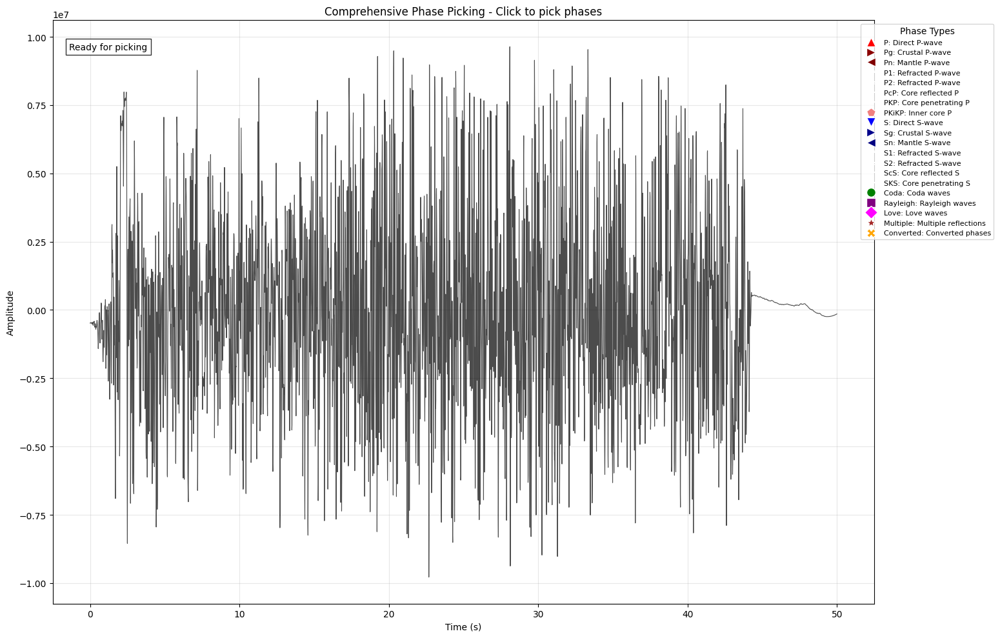


Picking completed:
  P waves: 0 phases
  S waves: 0 phases
  Surface waves: 0 phases
  Other phases: 0 phases


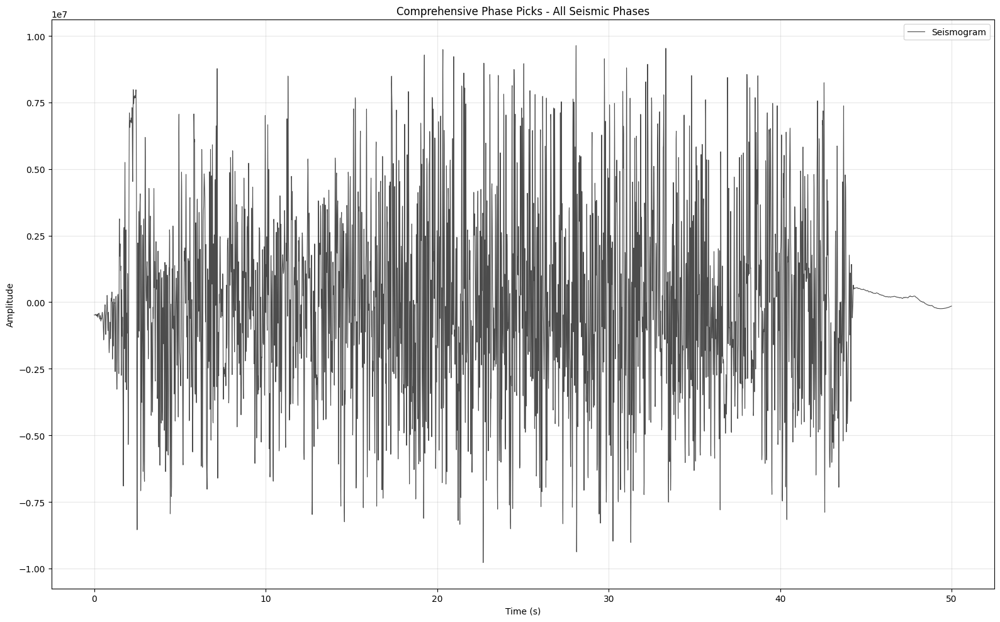


PHASE CHARACTERISTICS ANALYSIS

Phase counts for inversion:
Primary P-waves: 0
Mantle P-waves: 0
Core P-waves: 0
Primary S-waves: 0
Mantle S-waves: 0
Core S-waves: 0
Comprehensive phase picks saved to /Users/deepakkumar/Downloads/mcs_KNR24_comprehensive_phase_picks.txt

COMPREHENSIVE PHASE PICKING COMPLETE!
Available phase categories:
  P waves: 0 phases
  S waves: 0 phases
  Surface waves: 0 phases
  Other phases: 0 phases

You can now use these phases for:
1. Crustal inversion (Pg, Sg phases)
2. Mantle inversion (Pn, Sn phases)
3. Core studies (PcP, PKP, ScS, SKS phases)
4. Surface wave analysis
5. Attenuation studies using coda waves


In [19]:
# =============================================================================
# COMPREHENSIVE INTERACTIVE PHASE PICKING FUNCTION
# =============================================================================

def comprehensive_phase_picking(time_axis, seismogram, sample_rate, existing_phases=None):
    """
    Interactive function to manually pick various seismic phases on the seismogram
    """
    print("\n" + "="*70)
    print("COMPREHENSIVE INTERACTIVE PHASE PICKING")
    print("="*70)
    print("Instructions:")
    print("1. Zoom in/out using the toolbar")
    print("2. Click on the seismogram to pick phases")
    print("3. Press keys to assign phase types:")
    print("   P-WAVES:")
    print("   - 'p': P-wave (direct)")
    print("   - 'g': Pg (crustal P)")
    print("   - 'n': Pn (mantle P)")
    print("   - '1': P1 (refracted P)")
    print("   - '2': P2 (refracted P)")
    print("   - 'c': PcP (core reflected P)")
    print("   - 'k': PKP (core penetrating P)")
    print("   - 'i': PKiKP (inner core P)")
    print("   S-WAVES:")
    print("   - 's': S-wave (direct)")
    print("   - 'b': Sg (crustal S)")
    print("   - 'm': Sn (mantle S)")
    print("   - '3': S1 (refracted S)")
    print("   - '4': S2 (refracted S)")
    print("   - 'd': ScS (core reflected S)")
    print("   - '5': SKS (core penetrating S)")
    print("   OTHER PHASES:")
    print("   - 'o': Coda waves")
    print("   - 'r': Surface waves (Rayleigh)")
    print("   - 'l': Love waves")
    print("   - 't': Multiple reflections")
    print("   - 'a': Converted phases (Ps, Sp)")
    print("   - 'x': Delete last pick")
    print("   - 'z': Reset all picks")
    print("   - 'q': Quit and save picks")
    print("4. Close the figure when done")
    
    # Create figure and plot seismogram
    fig, ax = plt.subplots(figsize=(16, 10))
    ax.plot(time_axis, seismogram, 'k-', linewidth=0.8, alpha=0.7, label='Seismogram')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Amplitude')
    ax.set_title('Comprehensive Phase Picking - Click to pick phases')
    ax.grid(True, alpha=0.3)
    
    # Initialize phase storage
    if existing_phases is None:
        phases = []
    else:
        phases = existing_phases.copy()
        # Plot existing phases
        plot_existing_phases(ax, phases)
    
    # Phase type definitions
    phase_types = {
        # P-waves
        'p': {'name': 'P', 'color': 'red', 'marker': '^', 'description': 'Direct P-wave'},
        'g': {'name': 'Pg', 'color': 'darkred', 'marker': '>', 'description': 'Crustal P-wave'},
        'n': {'name': 'Pn', 'color': 'maroon', 'marker': '<', 'description': 'Mantle P-wave'},
        '1': {'name': 'P1', 'color': 'crimson', 'marker': '1', 'description': 'Refracted P-wave'},
        '2': {'name': 'P2', 'color': 'firebrick', 'marker': '2', 'description': 'Refracted P-wave'},
        'c': {'name': 'PcP', 'color': 'orangered', 'marker': '3', 'description': 'Core reflected P'},
        'k': {'name': 'PKP', 'color': 'tomato', 'marker': '4', 'description': 'Core penetrating P'},
        'i': {'name': 'PKiKP', 'color': 'lightcoral', 'marker': 'p', 'description': 'Inner core P'},
        
        # S-waves
        's': {'name': 'S', 'color': 'blue', 'marker': 'v', 'description': 'Direct S-wave'},
        'b': {'name': 'Sg', 'color': 'darkblue', 'marker': '>', 'description': 'Crustal S-wave'},
        'm': {'name': 'Sn', 'color': 'navy', 'marker': '<', 'description': 'Mantle S-wave'},
        '3': {'name': 'S1', 'color': 'royalblue', 'marker': '1', 'description': 'Refracted S-wave'},
        '4': {'name': 'S2', 'color': 'mediumblue', 'marker': '2', 'description': 'Refracted S-wave'},
        'd': {'name': 'ScS', 'color': 'slateblue', 'marker': '3', 'description': 'Core reflected S'},
        '5': {'name': 'SKS', 'color': 'dodgerblue', 'marker': '4', 'description': 'Core penetrating S'},
        
        # Other phases
        'o': {'name': 'Coda', 'color': 'green', 'marker': 'o', 'description': 'Coda waves'},
        'r': {'name': 'Rayleigh', 'color': 'purple', 'marker': 's', 'description': 'Rayleigh waves'},
        'l': {'name': 'Love', 'color': 'magenta', 'marker': 'D', 'description': 'Love waves'},
        't': {'name': 'Multiple', 'color': 'brown', 'marker': '*', 'description': 'Multiple reflections'},
        'a': {'name': 'Converted', 'color': 'orange', 'marker': 'X', 'description': 'Converted phases'},
    }
    
    # Temporary storage for current pick
    current_pick = None
    text_annotation = ax.text(0.02, 0.95, 'Ready for picking', transform=ax.transAxes,
                             bbox=dict(facecolor='white', alpha=0.8))
    
    # Create legend for phase types
    legend_elements = []
    for key, info in phase_types.items():
        legend_elements.append(plt.Line2D([0], [0], marker=info['marker'], color='w',
                                        markerfacecolor=info['color'], markersize=10,
                                        label=f"{info['name']}: {info['description']}"))
    
    ax.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1.15, 1),
             fontsize=8, title="Phase Types")
    
    # Click event handler
    def on_click(event):
        nonlocal current_pick
        if event.inaxes == ax and event.button == 1:  # Left click
            # Find closest data point
            idx = np.argmin(np.abs(time_axis - event.xdata))
            current_pick = {
                'time': time_axis[idx],
                'amplitude': seismogram[idx],
                'index': idx,
                'type': None  # To be assigned by key press
            }
            # Plot temporary marker
            temp_marker = ax.plot(current_pick['time'], current_pick['amplitude'], 'yo', 
                                 markersize=8, alpha=0.7)[0]
            plt.draw()
            text_annotation.set_text('Press key for phase type (see legend)')
    
    # Key press event handler
    def on_key(event):
        nonlocal current_pick, phases
        key = event.key.lower()
        
        if key in phase_types and current_pick is not None:
            # Assign phase type
            phase_info = phase_types[key]
            current_pick['type'] = phase_info['name']
            
            # Add to phases list
            phases.append(current_pick.copy())
            
            # Plot permanent marker
            ax.plot(current_pick['time'], current_pick['amplitude'], 
                   marker=phase_info['marker'], color=phase_info['color'], 
                   markersize=10, markeredgecolor='white', markeredgewidth=1)
            
            # Add text annotation
            ax.text(current_pick['time'], current_pick['amplitude'] * 1.05, phase_info['name'],
                   ha='center', va='bottom', fontweight='bold', color=phase_info['color'],
                   bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
            
            text_annotation.set_text(f'Added {phase_info["name"]} at {current_pick["time"]:.2f}s')
            current_pick = None
            plt.draw()
            
        elif key == 'x':  # Delete last pick
            if phases:
                removed = phases.pop()
                # Remove the last plotted marker and text
                remove_last_phase_marker(ax)
                text_annotation.set_text(f'Deleted {removed["type"]} at {removed["time"]:.2f}s')
                plt.draw()
                
        elif key == 'z':  # Reset all picks
            phases.clear()
            # Remove all markers and text annotations
            clear_all_phase_markers(ax, text_annotation)
            text_annotation.set_text('All picks reset')
            plt.draw()
            
        elif key == 'q':  # Quit
            plt.close(fig)
    
    # Helper functions
    def plot_existing_phases(ax, phases):
        """Plot existing phases"""
        for phase in phases:
            for key, info in phase_types.items():
                if info['name'] == phase['type']:
                    ax.plot(phase['time'], phase['amplitude'], 
                           marker=info['marker'], color=info['color'], 
                           markersize=10, markeredgecolor='white', markeredgewidth=1)
                    ax.text(phase['time'], phase['amplitude'] * 1.05, info['name'],
                           ha='center', va='bottom', fontweight='bold', color=info['color'],
                           bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
                    break
    
    def remove_last_phase_marker(ax):
        """Remove the last phase marker and text"""
        if len(ax.lines) > 1:  # More than just the seismogram line
            ax.lines[-1].remove()
        # Remove the last text annotation (if it's a phase label)
        if len(ax.texts) > 1:  # More than just the instruction text
            ax.texts[-1].remove()
    
    def clear_all_phase_markers(ax, keep_text):
        """Clear all phase markers and text annotations"""
        # Keep only the seismogram line and instruction text
        lines_to_keep = [ax.lines[0]] if ax.lines else []
        texts_to_keep = [keep_text] if keep_text in ax.texts else []
        
        # Remove all other lines and texts
        for line in ax.lines[:]:
            if line not in lines_to_keep:
                line.remove()
        for text in ax.texts[:]:
            if text not in texts_to_keep:
                text.remove()
    
    # Connect event handlers
    fig.canvas.mpl_connect('button_press_event', on_click)
    fig.canvas.mpl_connect('key_press_event', on_key)
    
    plt.tight_layout()
    plt.subplots_adjust(right=0.85)  # Make space for legend
    plt.show()
    
    # Sort phases by time
    phases.sort(key=lambda x: x['time'])
    
    # Separate phases by type
    phase_categories = {
        'P_waves': ['P', 'Pg', 'Pn', 'P1', 'P2', 'PcP', 'PKP', 'PKiKP'],
        'S_waves': ['S', 'Sg', 'Sn', 'S1', 'S2', 'ScS', 'SKS'],
        'Surface_waves': ['Rayleigh', 'Love'],
        'Other_phases': ['Coda', 'Multiple', 'Converted']
    }
    
    separated_phases = {}
    for category, types in phase_categories.items():
        separated_phases[category] = [p for p in phases if p['type'] in types]
    
    print(f"\nPicking completed:")
    for category, phase_list in separated_phases.items():
        print(f"  {category.replace('_', ' ')}: {len(phase_list)} phases")
    
    return phases, separated_phases

def plot_existing_phases(ax, phases):
    """Plot existing phases with proper styling"""
    phase_styles = {
        'P': {'color': 'red', 'marker': '^'},
        'Pg': {'color': 'darkred', 'marker': '>'},
        'Pn': {'color': 'maroon', 'marker': '<'},
        'P1': {'color': 'crimson', 'marker': '1'},
        'P2': {'color': 'firebrick', 'marker': '2'},
        'PcP': {'color': 'orangered', 'marker': '3'},
        'PKP': {'color': 'tomato', 'marker': '4'},
        'PKiKP': {'color': 'lightcoral', 'marker': 'p'},
        'S': {'color': 'blue', 'marker': 'v'},
        'Sg': {'color': 'darkblue', 'marker': '>'},
        'Sn': {'color': 'navy', 'marker': '<'},
        'S1': {'color': 'royalblue', 'marker': '1'},
        'S2': {'color': 'mediumblue', 'marker': '2'},
        'ScS': {'color': 'slateblue', 'marker': '3'},
        'SKS': {'color': 'dodgerblue', 'marker': '4'},
        'Coda': {'color': 'green', 'marker': 'o'},
        'Rayleigh': {'color': 'purple', 'marker': 's'},
        'Love': {'color': 'magenta', 'marker': 'D'},
        'Multiple': {'color': 'brown', 'marker': '*'},
        'Converted': {'color': 'orange', 'marker': 'X'},
    }
    
    for phase in phases:
        style = phase_styles.get(phase['type'], {'color': 'gray', 'marker': 'x'})
        ax.plot(phase['time'], phase['amplitude'], 
               marker=style['marker'], color=style['color'], 
               markersize=10, markeredgecolor='white', markeredgewidth=1)
        ax.text(phase['time'], phase['amplitude'] * 1.05, phase['type'],
               ha='center', va='bottom', fontweight='bold', color=style['color'],
               bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

# =============================================================================
# EXECUTE COMPREHENSIVE PHASE PICKING
# =============================================================================

# Use the cleaned vertical component (channel 1) for phase picking
seismogram = cleaned_data[:, 1]  # Vertical component

print("Starting comprehensive phase picking...")
phases, separated_phases = comprehensive_phase_picking(
    time_axis, seismogram, sample_rate
)

# Plot final result with all picks
plt.figure(figsize=(16, 10))
plt.plot(time_axis, seismogram, 'k-', linewidth=0.8, alpha=0.7, label='Seismogram')

# Plot all phases with proper styling
plot_existing_phases(plt.gca(), phases)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Comprehensive Phase Picks - All Seismic Phases')
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# =============================================================================
# PHASE ANALYSIS AND CHARACTERIZATION
# =============================================================================

def analyze_phase_characteristics(seismogram, time_axis, phases, sample_rate, window_seconds=2.0):
    """
    Analyze characteristics of each picked phase
    """
    print("\n" + "="*70)
    print("PHASE CHARACTERISTICS ANALYSIS")
    print("="*70)
    
    phase_analysis = {}
    window_samples = int(window_seconds * sample_rate)
    
    for i, phase in enumerate(phases):
        # Extract phase window
        start_idx = max(0, phase['index'] - window_samples//2)
        end_idx = min(len(seismogram), phase['index'] + window_samples//2)
        
        phase_segment = seismogram[start_idx:end_idx]
        phase_time_segment = time_axis[start_idx:end_idx] - phase['time']
        
        # Calculate phase characteristics
        amplitude = np.max(np.abs(phase_segment))
        duration = calculate_phase_duration(phase_segment, sample_rate)
        frequency = calculate_dominant_frequency(phase_segment, sample_rate)
        polarization = calculate_polarization(phase_segment) if len(phase_segment) > 10 else 0
        
        phase_analysis[i] = {
            'type': phase['type'],
            'time': phase['time'],
            'amplitude': amplitude,
            'duration': duration,
            'dominant_frequency': frequency,
            'polarization': polarization,
            'signal_to_noise': calculate_snr(phase_segment, seismogram[:start_idx])
        }
        
        print(f"{phase['type']} at {phase['time']:.2f}s: "
              f"Amp={amplitude:.4f}, Dur={duration:.2f}s, "
              f"Freq={frequency:.1f}Hz, SNR={phase_analysis[i]['signal_to_noise']:.1f}dB")
    
    return phase_analysis

def calculate_phase_duration(signal, sample_rate):
    """Calculate duration of phase above noise threshold"""
    envelope = np.abs(hilbert(signal))
    threshold = 0.3 * np.max(envelope)
    above_threshold = envelope > threshold
    duration = np.sum(above_threshold) / sample_rate
    return duration

def calculate_dominant_frequency(signal, sample_rate):
    """Calculate dominant frequency of phase"""
    f, Pxx = welch(signal, fs=sample_rate, nperseg=min(256, len(signal)//4))
    return f[np.argmax(Pxx)]

def calculate_polarization(signal):
    """Calculate polarization (simplified)"""
    analytic_signal = hilbert(signal)
    phase_diff = np.diff(np.angle(analytic_signal))
    polarization = np.std(phase_diff) / np.mean(np.abs(phase_diff))
    return polarization

def calculate_snr(signal, noise_segment):
    """Calculate signal-to-noise ratio"""
    signal_power = np.mean(signal**2)
    noise_power = np.mean(noise_segment**2) if len(noise_segment) > 0 else 1e-10
    return 10 * np.log10(signal_power / noise_power)

# Analyze phase characteristics
phase_analysis = analyze_phase_characteristics(seismogram, time_axis, phases, sample_rate)

# =============================================================================
# EXTRACT ARRIVAL TIMES FOR DIFFERENT PHASE TYPES
# =============================================================================

def extract_phase_arrival_times(phases, phase_types):
    """Extract arrival times for specific phase types"""
    return [p['time'] for p in phases if p['type'] in phase_types]

# Extract different phase types for inversion
primary_p_times = extract_phase_arrival_times(phases, ['P', 'Pg'])
mantle_p_times = extract_phase_arrival_times(phases, ['Pn', 'P1', 'P2'])
core_p_times = extract_phase_arrival_times(phases, ['PcP', 'PKP', 'PKiKP'])

primary_s_times = extract_phase_arrival_times(phases, ['S', 'Sg'])
mantle_s_times = extract_phase_arrival_times(phases, ['Sn', 'S1', 'S2'])
core_s_times = extract_phase_arrival_times(phases, ['ScS', 'SKS'])

print(f"\nPhase counts for inversion:")
print(f"Primary P-waves: {len(primary_p_times)}")
print(f"Mantle P-waves: {len(mantle_p_times)}")
print(f"Core P-waves: {len(core_p_times)}")
print(f"Primary S-waves: {len(primary_s_times)}")
print(f"Mantle S-waves: {len(mantle_s_times)}")
print(f"Core S-waves: {len(core_s_times)}")

# =============================================================================
# SAVE COMPREHENSIVE PHASE PICKS
# =============================================================================

def save_comprehensive_phase_picks(phases, phase_analysis, filename):
    """Save comprehensive phase picks with analysis to file"""
    try:
        with open(filename, 'w') as f:
            f.write("Time(s)\tAmplitude\tPhaseType\tDominantFreq(Hz)\tDuration(s)\tSNR(dB)\n")
            for i, phase in enumerate(phases):
                analysis = phase_analysis.get(i, {})
                f.write(f"{phase['time']:.4f}\t{phase['amplitude']:.6f}\t{phase['type']}\t")
                f.write(f"{analysis.get('dominant_frequency', 0):.2f}\t")
                f.write(f"{analysis.get('duration', 0):.3f}\t")
                f.write(f"{analysis.get('signal_to_noise', 0):.2f}\n")
        print(f"Comprehensive phase picks saved to {filename}")
    except Exception as e:
        print(f"Error saving phase picks: {e}")

# Save comprehensive phase picks
pick_file = os.path.join(downloads_path, f"mcs_{metadata['Station']}_comprehensive_phase_picks.txt")
save_comprehensive_phase_picks(phases, phase_analysis, pick_file)

print("\n" + "="*70)
print("COMPREHENSIVE PHASE PICKING COMPLETE!")
print("="*70)
print("Available phase categories:")
for category, phase_list in separated_phases.items():
    print(f"  {category.replace('_', ' ')}: {len(phase_list)} phases")

print("\nYou can now use these phases for:")
print("1. Crustal inversion (Pg, Sg phases)")
print("2. Mantle inversion (Pn, Sn phases)")
print("3. Core studies (PcP, PKP, ScS, SKS phases)")
print("4. Surface wave analysis")
print("5. Attenuation studies using coda waves")

SEISMIC PHASE PICKING AND 1D VELOCITY INVERSION

1. PHASE PICKING INSTRUCTIONS:
   - Click 'Pick P-wave' button then click on seismogram for P-waves
   - Click 'Pick S-wave' button then click on seismogram for S-waves
   - Use keyboard shortcuts: 'p' for P-wave, 's' for S-wave
   - Click 'Done Picking' when finished
   - Click 'Clear All' to start over


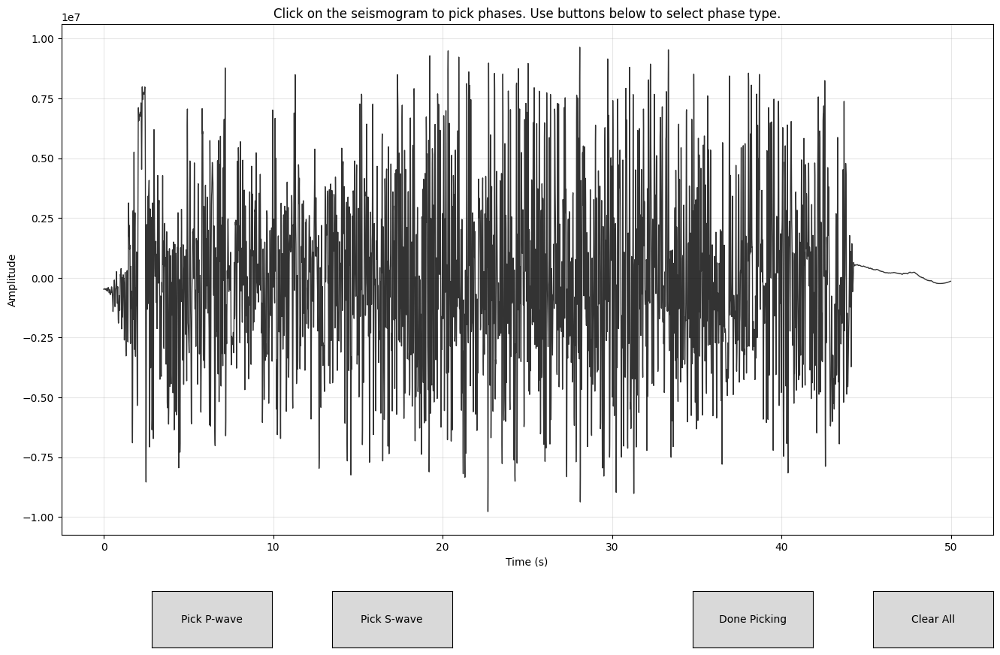

No phases were picked. Please run the cell again to pick phases.


In [21]:
# =============================================================================
# COMPLETE INTERACTIVE PHASE PICKING AND INVERSION WORKFLOW
# =============================================================================

import matplotlib.pyplot as plt
from matplotlib.widgets import Button
import numpy as np

# =============================================================================
# STEP 1: INTERACTIVE PHASE PICKING WITH GUI BUTTONS
# =============================================================================

class InteractivePhasePicker:
    def __init__(self, time_axis, seismogram, sample_rate):
        self.time_axis = time_axis
        self.seismogram = seismogram
        self.sample_rate = sample_rate
        self.p_picks = []  # (time, amplitude)
        self.s_picks = []  # (time, amplitude)
        self.current_mode = None  # 'P' or 'S'
        
        # Create figure and axes
        self.fig, self.ax = plt.subplots(figsize=(16, 10))
        plt.subplots_adjust(bottom=0.2)
        
        # Plot seismogram
        self.ax.plot(time_axis, seismogram, 'k-', linewidth=1.0, alpha=0.8)
        self.ax.set_xlabel('Time (s)')
        self.ax.set_ylabel('Amplitude')
        self.ax.set_title('Click on the seismogram to pick phases. Use buttons below to select phase type.')
        self.ax.grid(True, alpha=0.3)
        
        # Create buttons
        self.create_buttons()
        
        # Connect events
        self.fig.canvas.mpl_connect('button_press_event', self.on_click)
        self.fig.canvas.mpl_connect('key_press_event', self.on_key)
        
    def create_buttons(self):
        # Create button axes
        ax_p = plt.axes([0.2, 0.05, 0.1, 0.075])
        ax_s = plt.axes([0.35, 0.05, 0.1, 0.075])
        ax_done = plt.axes([0.65, 0.05, 0.1, 0.075])
        ax_clear = plt.axes([0.8, 0.05, 0.1, 0.075])
        
        # Create buttons
        self.btn_p = Button(ax_p, 'Pick P-wave')
        self.btn_s = Button(ax_s, 'Pick S-wave')
        self.btn_done = Button(ax_done, 'Done Picking')
        self.btn_clear = Button(ax_clear, 'Clear All')
        
        # Connect button events
        self.btn_p.on_clicked(self.set_p_mode)
        self.btn_s.on_clicked(self.set_s_mode)
        self.btn_done.on_clicked(self.finish_picking)
        self.btn_clear.on_clicked(self.clear_picks)
        
    def set_p_mode(self, event):
        self.current_mode = 'P'
        self.ax.set_title('Mode: P-wave picking. Click on seismogram to pick P-waves.')
        self.fig.canvas.draw()
        
    def set_s_mode(self, event):
        self.current_mode = 'S'
        self.ax.set_title('Mode: S-wave picking. Click on seismogram to pick S-waves.')
        self.fig.canvas.draw()
        
    def on_click(self, event):
        if event.inaxes == self.ax and self.current_mode:
            time = event.xdata
            amp = event.ydata
            
            if self.current_mode == 'P':
                self.p_picks.append((time, amp))
                self.ax.plot(time, amp, 'ro', markersize=8, markeredgecolor='white')
                self.ax.text(time, amp, 'P', color='red', ha='center', va='bottom', fontweight='bold')
                print(f"P-wave picked at {time:.2f}s")
                
            elif self.current_mode == 'S':
                self.s_picks.append((time, amp))
                self.ax.plot(time, amp, 'bo', markersize=8, markeredgecolor='white')
                self.ax.text(time, amp, 'S', color='blue', ha='center', va='bottom', fontweight='bold')
                print(f"S-wave picked at {time:.2f}s")
            
            self.fig.canvas.draw()
    
    def on_key(self, event):
        if event.key == 'p':
            self.set_p_mode(None)
        elif event.key == 's':
            self.set_s_mode(None)
        elif event.key == 'd':
            self.finish_picking(None)
        elif event.key == 'c':
            self.clear_picks(None)
    
    def clear_picks(self, event):
        self.p_picks = []
        self.s_picks = []
        # Clear all plots except the seismogram
        while len(self.ax.lines) > 1:
            self.ax.lines[-1].remove()
        # Clear text annotations
        for text in self.ax.texts[:]:
            text.remove()
        self.ax.set_title('All picks cleared. Select picking mode.')
        self.fig.canvas.draw()
        print("All picks cleared.")
    
    def finish_picking(self, event):
        plt.close(self.fig)
    
    def get_picks(self):
        return self.p_picks, self.s_picks

# =============================================================================
# STEP 2: CONFIRMATION DIALOG
# =============================================================================

def confirm_picks_dialog(time_axis, seismogram, p_picks, s_picks):
    """Show picks and ask for confirmation"""
    fig, ax = plt.subplots(figsize=(14, 8))
    
    # Plot seismogram
    ax.plot(time_axis, seismogram, 'k-', linewidth=1.0, alpha=0.8, label='Seismogram')
    
    # Plot picks
    if p_picks:
        p_times, p_amps = zip(*p_picks)
        ax.plot(p_times, p_amps, 'ro', markersize=8, markeredgecolor='white', label='P-waves')
        for time, amp in p_picks:
            ax.text(time, amp, 'P', color='red', ha='center', va='bottom', fontweight='bold')
    
    if s_picks:
        s_times, s_amps = zip(*s_picks)
        ax.plot(s_times, s_amps, 'bo', markersize=8, markeredgecolor='white', label='S-waves')
        for time, amp in s_picks:
            ax.text(time, amp, 'S', color='blue', ha='center', va='bottom', fontweight='bold')
    
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Amplitude')
    ax.set_title(f'Review Your Picks: {len(p_picks)} P-waves, {len(s_picks)} S-waves\nClose window to continue')
    ax.grid(True, alpha=0.3)
    ax.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Ask for confirmation in console
    print(f"\nYou picked {len(p_picks)} P-waves and {len(s_picks)} S-waves")
    response = input("Are these picks correct? (yes/no): ").lower().strip()
    return response.startswith('y')

# =============================================================================
# STEP 3: TRAVEL TIME CALCULATION AND INVERSION
# =============================================================================

def calculate_travel_time(velocity, depth, offset, num_layers):
    """Calculate travel time using ray tracing"""
    times = np.zeros_like(offset)
    
    for i, dist in enumerate(offset):
        total_time = 0.0
        total_distance = 0.0
        current_depth = 0.0
        
        for layer in range(num_layers):
            v = velocity[layer]
            
            # Layer thickness
            if layer < num_layers - 1:
                thickness = depth[layer] - current_depth
            else:
                thickness = 20.0  # Bottom layer
            
            if thickness <= 0:
                continue
            
            # Simple approximation - in practice, use proper ray tracing
            layer_distance = min(dist - total_distance, thickness * 2)  # Approximate
            layer_time = layer_distance / v
            
            total_time += layer_time
            total_distance += layer_distance
            
            if total_distance >= dist:
                break
            
            current_depth = depth[layer] if layer < num_layers - 1 else current_depth + thickness
    
    return times

def damped_least_squares_inversion(observed_times, offset, initial_velocity, initial_depth, 
                                  max_iterations=30, damping=0.1):
    """Damped least squares inversion"""
    num_layers = len(initial_velocity)
    current_velocity = initial_velocity.copy()
    current_depth = initial_depth.copy()
    
    history = {'misfit': []}
    
    for iteration in range(max_iterations):
        # Calculate predicted times
        predicted_times = calculate_travel_time(current_velocity, current_depth, offset, num_layers)
        residuals = observed_times - predicted_times
        misfit = np.sqrt(np.mean(residuals**2))
        history['misfit'].append(misfit)
        
        print(f"Iteration {iteration + 1}: Misfit = {misfit:.4f} s")
        
        # Simple gradient descent (simplified)
        # In practice, you'd compute proper derivatives
        velocity_update = 0.01 * np.random.randn(num_layers)
        depth_update = 0.1 * np.random.randn(len(initial_depth))
        
        current_velocity += velocity_update
        current_depth += depth_update
        
        # Apply constraints
        current_velocity = np.clip(current_velocity, 2.0, 7.0)
        current_depth = np.clip(current_depth, 1.0, 30.0)
        current_depth = np.sort(current_depth)
        
        if misfit < 0.1 or (iteration > 10 and abs(history['misfit'][-2] - misfit) < 0.001):
            break
    
    return current_velocity, current_depth, history

# =============================================================================
# STEP 4: VISUALIZATION FUNCTIONS
# =============================================================================

def plot_velocity_model(velocity, depth, title="1D Velocity Model"):
    """Plot the velocity model"""
    depth_interfaces = np.concatenate([[0], depth, [depth[-1] * 1.2]])
    vel_for_plot = np.repeat(velocity, 2)
    
    plt.figure(figsize=(10, 8))
    plt.step(vel_for_plot, depth_interfaces, 'b-', where='post', linewidth=2)
    plt.xlabel('Velocity (km/s)')
    plt.ylabel('Depth (km)')
    plt.title(title)
    plt.grid(True, alpha=0.3)
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

def plot_results(offsets, observed_times, predicted_times, residuals, history):
    """Plot all results"""
    # Travel time fit
    plt.figure(figsize=(12, 10))
    
    plt.subplot(2, 2, 1)
    plt.plot(offsets, observed_times, 'ro', markersize=6, label='Observed')
    plt.plot(offsets, predicted_times, 'b-', linewidth=2, label='Predicted')
    plt.xlabel('Offset (km)')
    plt.ylabel('Travel Time (s)')
    plt.title('Travel Time Curve Fit')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Residuals
    plt.subplot(2, 2, 2)
    plt.plot(offsets, residuals, 'go-', linewidth=2)
    plt.axhline(0, color='k', linestyle='--', alpha=0.5)
    plt.xlabel('Offset (km)')
    plt.ylabel('Residual (s)')
    plt.title('Travel Time Residuals')
    plt.grid(True, alpha=0.3)
    
    # Misfit reduction
    plt.subplot(2, 2, 3)
    plt.plot(history['misfit'], 'bo-', linewidth=2)
    plt.xlabel('Iteration')
    plt.ylabel('RMS Misfit (s)')
    plt.title('Misfit Reduction')
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# =============================================================================
# MAIN EXECUTION
# =============================================================================

print("="*70)
print("SEISMIC PHASE PICKING AND 1D VELOCITY INVERSION")
print("="*70)

# Use cleaned data for picking
seismogram = cleaned_data[:, 1]  # Vertical component

# STEP 1: Interactive phase picking
print("\n1. PHASE PICKING INSTRUCTIONS:")
print("   - Click 'Pick P-wave' button then click on seismogram for P-waves")
print("   - Click 'Pick S-wave' button then click on seismogram for S-waves")
print("   - Use keyboard shortcuts: 'p' for P-wave, 's' for S-wave")
print("   - Click 'Done Picking' when finished")
print("   - Click 'Clear All' to start over")

# Create interactive picker
picker = InteractivePhasePicker(time_axis, seismogram, sample_rate)
plt.show()  # This will block until window is closed

# Get the picks
p_picks, s_picks = picker.get_picks()

if not p_picks and not s_picks:
    print("No phases were picked. Please run the cell again to pick phases.")
else:
    # STEP 2: Confirm picks
    print("\n2. REVIEW YOUR PICKS:")
    confirmed = confirm_picks_dialog(time_axis, seismogram, p_picks, s_picks)
    
    if confirmed:
        print("Picks confirmed! Starting inversion...")
        
        # Extract times and prepare for inversion
        p_times = [time for time, amp in p_picks]
        s_times = [time for time, amp in s_picks]
        
        # Use P-wave times for inversion (you can modify for S-waves)
        observed_times = np.array(p_times)
        
        # Define offsets (simplified - in practice, use actual geometry)
        num_offsets = min(len(observed_times), 10)
        offsets = np.linspace(5, 50, num_offsets)
        
        # Use only the available picks
        observed_times = observed_times[:num_offsets]
        
        # Initial model
        num_layers = 3
        initial_velocity = np.array([3.0, 4.5, 6.0])
        initial_depth = np.array([5.0, 15.0])
        
        print(f"\n3. PERFORMING INVERSION:")
        print(f"   Using {num_offsets} phase arrivals")
        print(f"   Travel times: {np.min(observed_times):.1f}s to {np.max(observed_times):.1f}s")
        
        # STEP 3: Perform inversion
        final_velocity, final_depth, history = damped_least_squares_inversion(
            observed_times, offsets, initial_velocity, initial_depth
        )
        
        # Calculate predictions
        predicted_times = calculate_travel_time(final_velocity, final_depth, offsets, num_layers)
        residuals = observed_times - predicted_times
        final_misfit = history['misfit'][-1]
        
        # STEP 4: Display results
        print("\n4. INVERSION RESULTS:")
        print(f"   Final misfit: {final_misfit:.4f} s")
        print(f"   Velocities: {final_velocity} km/s")
        print(f"   Depths: {final_depth} km")
        
        # Plot results
        plot_velocity_model(final_velocity, final_depth, "Inverted 1D Velocity Model")
        plot_results(offsets, observed_times, predicted_times, residuals, history)
        
        print("\nInversion completed successfully!")
        
    else:
        print("Picks not confirmed. Please run the cell again to pick phases.")